# Clustering

In [2]:
# Load necessary packages
import numpy as np                                   # numerical computing library for array operations
import matplotlib.pyplot as plt                      # library for creating static, animated, and interactive visualizations
import matplotlib.animation as animation             # module for creating animations with Matplotlib
from matplotlib import rc                            # module to configure Matplotlib settings
import seaborn as sns                                # library for data visualization based on Matplotlib
import pandas as pd                                  # library for data manipulation and analysis

rc('animation', html='jshtml')                       # configure Matplotlib to use JavaScript-based animations in Jupyter Notebooks
rng = np.random.RandomState(1)                       # set the random seed for reproducibility

qualitative_colors = ['#1b9e77', '#d95f02', '#7570b3', '#e7298a']  # define a set of colors for plotting
                                                                   # four color-blind friendly qualitative colors, and black for contrast

## Load Some Example Data

In [3]:
from sklearn.datasets import make_blobs  # function to generate synthetic clusterable datasets for testing and visualization

### Clustering Dataset Explanation 

Clustering is a type of unsupervised machine learning where the goal is to group a set of data points into subsets, called clusters, such that data points within the same cluster are more similar to each other than to those in other clusters. Clustering is often used when there are no predefined labels or categories in the dataset, and the goal is to discover hidden patterns or structures in the data.

In [4]:
# make the data set.
number_of_data_points = 500                                        # define the number of data points to generate
X, y = make_blobs(n_samples=number_of_data_points, random_state=1) # function that generates synthetic data with 500 samples using make_blobs
                                                                   # X contains the feature coordinates: a 2D array (matrix) that holds the
                                                                   # coordinates of the generated points.
                                                                   # for example, if you generate 500 points, X will have 500 rows and 2 
                                                                   # columns, where each row is a point with its x and y coordinates
                                                                   # Y contains the cluster labels: for example, if the function creates 
                                                                   # three clusters, y might look like [0, 1, 2, 0, 1, ...], where 0, 1, 
                                                                   # and 2 are the cluster IDs.



Text(0, 0.5, '$x_2$')

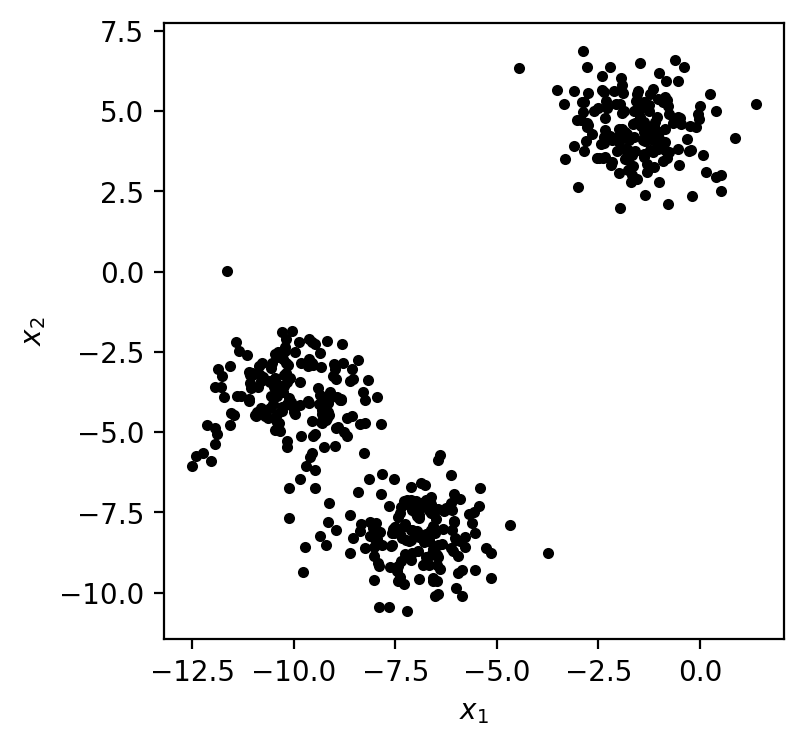

In [5]:
# Plot the data set.
fig, axs = plt.subplots(figsize=(4., 4.), nrows=1, ncols=1, facecolor='white', dpi=200) # create a figure with size 4x4 inches, 
                                                                                        # 1 subplot, white background, and 200 dpi resolution
axs.plot(X[:, 0], X[:, 1], marker='o', linewidth=0.0, markerfacecolor='k', markeredgecolor='none', markersize=4, zorder=0) # plot the data
                                                                                                                           # points with 
                                                                                                                           # black circular 
                                                                                                                           # markers, 
                                                                                                                           # no edges, 
                                                                                                                           # and size 4
axs.set_xlabel(r'$x_1$')  # Set the x-axis label to 'x₁' using LaTeX-style formatting
axs.set_ylabel(r'$x_2$')  # Set the y-axis label to 'x₂' using LaTeX-style formatting



## K-means Algorithm


### Step 0

#### Choose the initial centers of the clusters.
#### A simple method to do this is to randomly choose samples points from the dataset.

In **Step 0** of the K-means algorithm, we select the **initial cluster centers** (or centroids). These centers are the starting points for the clustering process. The goal is to assign data points to these clusters and iteratively refine the cluster centers to better fit the data.

#### Why is it important ?
- The **initial cluster centers** determine how the algorithm starts grouping data points.
- If the initial centers are poorly chosen, the algorithm might:
  - Converge to **suboptimal clusters** (local minima).
  - Take **longer to converge**.

### How to Choose Initial Cluster Centers?
One simple and widely used method is to **randomly select `k` points from the dataset** as the initial cluster centers, where:
- `k` = Number of clusters we want to create.
- The selected points serve as the starting guess for the cluster centroids.

### Steps for Random Initialization
1. **Decide the Number of Clusters (`k`):**
   - For example, if you want to create 3 clusters, set `k = 3`.

2. **Randomly Select Points:**
   - From the dataset, randomly choose `k` points.
   - These points will act as the initial guesses for the cluster centers.

3. **Continue with the K-means Algorithm:**
   - After choosing the initial centers, proceed to:
     1. Assign data points to the nearest cluster center (Step 1).
     2. Recalculate the cluster centers (Step 2).

#### Example:
Suppose you have the following datapoints: 
Points(1,1),(2,2),(8,8),(9,9),(3,3),(4,4)

1. **Choose `k=2`:**
   - You want to form 2 clusters.

2. **Randomly Select Points as Initial Centers:**
   - Randomly pick `(1, 1)` and `(9, 9)` as the initial centers.

3. **Next Steps:**
   - Assign the remaining points to the closest center.
   - Recalculate the new centers based on these assignments.


#### Visualization
Imagine a scatterplot of points on a 2D plane. Choosing random points as initial centers is like picking a few points and saying, "Let's assume these are the centers of our clusters for now. We'll refine them as we go."



#### Why Start with Random Points?
- It’s simple and computationally inexpensive.
- While not optimal, it works reasonably well for most datasets.
- More advanced methods like **K-means++** improve this step by selecting points that are far apart, reducing the likelihood of poor clustering.




In [6]:
number_of_clusters = 3                      # define the number of clusters (K) to form
                                            # randomly choose K points from the dataset, without replacement
rng = np.random.default_rng(seed=21474836)  # create a random number generator with a fixed seed for reproducibility
centroids_initial = rng.choice(X, size=number_of_clusters, replace=False, axis=0)  # select K random points from X as initial cluster centers
print(centroids_initial.shape)                                                     # print the shape of the initial centroids array to verify
                                                                                   # dimensions


(3, 2)


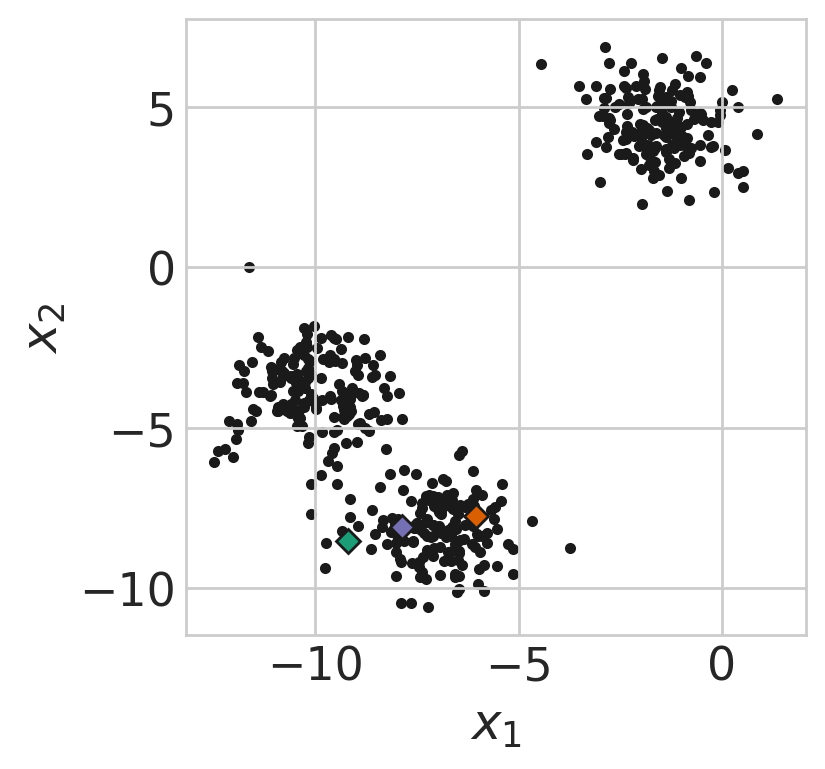

In [62]:
fig, axs = plt.subplots(figsize=(4., 4.), nrows=1, ncols=1, facecolor='white', dpi=200) # create a figure with a single subplot,
                                                                                        # white background, and 200 dpi resolution
# plot the data points with black circular markers, no edges, and size 4
axs.plot(X[:, 0], X[:, 1], marker='o', linewidth=0.0, markerfacecolor='k', markeredgecolor='none', markersize=4, zorder=-10)
# plot the initial cluster centers with diamond markers, unique colors, and black edges
for j in range(number_of_clusters):  # Loop over each cluster
    axs.plot(centroids_initial[j, 0], centroids_initial[j, 1], marker='D', markerfacecolor=qualitative_colors[j], markeredgecolor='k', zorder=0)
axs.set_xlabel(r'$x_1$')   # label the x-axis with LaTeX-style formatting for variable x₁
axs.set_ylabel(r'$x_2$');  # label the y-axis with LaTeX-style formatting for variable x₂


### Step 1

#### Assign each data point to a cluster based on which cluster center is closest.

In [63]:
# define a function to perform the first step of K-means: assigning data points to the nearest cluster center.
def calculate_nearest_cluster_center(X, centroids):
    """
    Assign each data point to a cluster based on which cluster center is closest.
    
    Parameters
    ----------
    X : array_like
        Data points, shape (number of data points, number of features).
    centroids : array_like
        Centers of each cluster, shape (number of clusters, number of features).
    
    Returns
    ----------
    nearest_cluster_center : array_like
        Cluster each data point is assigned to, shape (number of data points, 1).
    """
    n_data_points = X.shape[0]                        # get the number of data points from the shape of X
    n_clusters = centroids.shape[0]                   # get the number of clusters from the shape of centroids
    distances = np.empty((n_data_points, n_clusters)) # create an empty array to store distances between points and cluster centers
    
    for i in range(n_clusters):                       # iterate over each cluster
                                                      # calculate the Euclidean distance between data points and the current cluster center
        distances[:, i] = np.sqrt(np.power(X[:, 0] - centroids[i, 0], 2) + np.power(X[:, 1] - centroids[i, 1], 2))
    
    nearest_cluster_center = np.argmin(distances, axis=1)  # find the cluster center with the minimum distance for each data point
    return nearest_cluster_center  # return the assigned cluster for each data point


#### Example that explains the extraction of the nearest distances from teh cluster center 
distances = np.array([  
    [1.2, 2.3, 0.8],  # Distances of Point 1 to Clusters 1, 2, 3  
    [2.5, 1.1, 3.0],  # Distances of Point 2 to Clusters 1, 2, 3  
    [0.6, 1.8, 2.2],  # Distances of Point 3 to Clusters 1, 2, 3  
    [1.5, 0.9, 1.7],  # Distances of Point 4 to Clusters 1, 2, 3  
    [2.0, 3.0, 1.0]   # Distances of Point 5 to Clusters 1, 2, 3  
])  


#### output for the Example   
using the distances array above:  
nearest_cluster_center = np.argmin(distances, axis=1)  

#### The result would be   
nearest_cluster_center = [2, 1, 0, 1, 2]  
This indicates : 

This indicates:  
- Point 1 is closest to Cluster 3 (index 2).
- Point 2 is closest to Cluster 2 (index 1).
- Point 3 is closest to Cluster 1 (index 0), and so on.


In [64]:
predicted_cluster = calculate_nearest_cluster_center(X, centroids_initial)  # assign each data point to the nearest cluster
                                                                            # based on the initial cluster centers

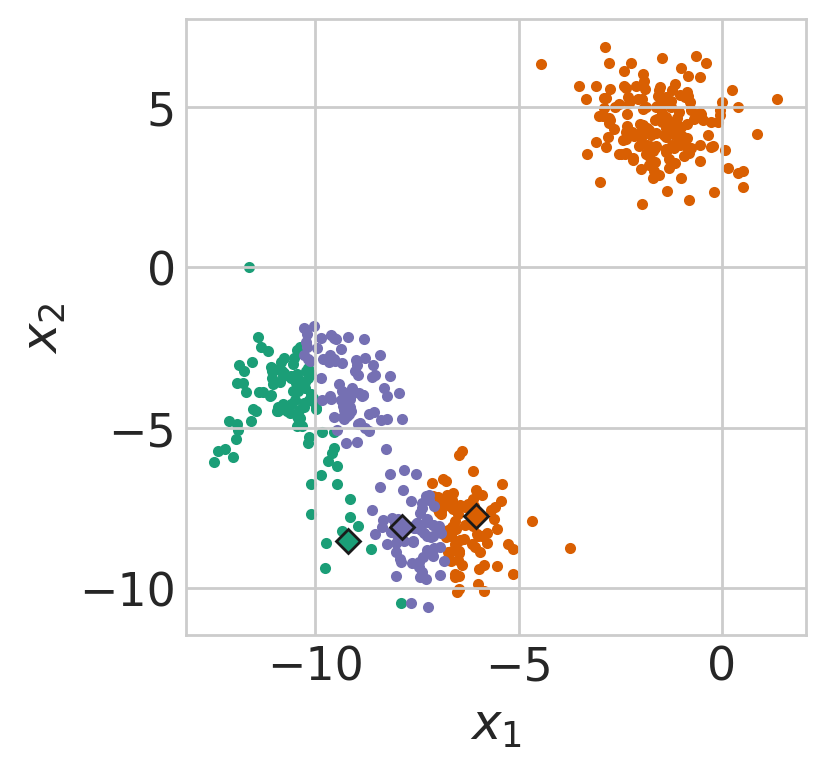

In [65]:
# plot the data set colored based on the cluster assignments and the initial centers of the clusters.

fig, axs = plt.subplots(figsize=(4., 4.), nrows=1, ncols=1, facecolor='white', dpi=200) # create a figure with a single subplot, white 
                                                                                        # background, and 200 dpi resolution


for j in range(number_of_clusters): # iterate through each cluster and plot the data points and initial centers
                                    # plot data points assigned to the current cluster, using the cluster's specific color
    axs.plot(X[predicted_cluster == j, 0], X[predicted_cluster == j, 1], marker='o', linewidth=0.0,
             markerfacecolor=qualitative_colors[j], markeredgecolor='none', markersize=4, zorder=-10)
    # plot the initial cluster center as a diamond marker with a black edge
    axs.plot(centroids_initial[j, 0], centroids_initial[j, 1], marker='D', markerfacecolor=qualitative_colors[j],
             markeredgecolor='k', zorder=0)

# label the x-axis with LaTeX-style formatting for variable x₁
axs.set_xlabel(r'$x_1$')

# label the y-axis with LaTeX-style formatting for variable x₂
axs.set_ylabel(r'$x_2$');


### Step 2

#### Determine new cluster centers by calculating the mean position of all the data points assigned to the cluster.

In [66]:
# define a function to perform the second step of K-means: recalculating the cluster centers.
def calculate_cluster_mean(X, cluster_assignments):
    """
    Determine new cluster centers by calculating the mean position of all the data points assigned to the cluster.
    
    Parameters
    ----------
    X : array_like
        Data points, shape (number of data points, number of features).
    cluster_assignments : array_like
        Cluster each data point is assigned to, shape (number of data points, 1).
    
    Returns
    ----------
    mean_positions : array_like
        Mean position of all the data points assigned to the cluster, shape (number of clusters, number of features).
    """
    n_clusters = np.unique(cluster_assignments).shape[0]  # get the number of unique clusters
    n_features = X.shape[1]                               # get the number of features in the dataset
    mean_positions = np.empty((n_clusters, n_features))   # create an empty array to store the mean positions of each cluster
    
    for i in range(n_clusters):  # iterate over each cluster
                                 # calculate the mean position of all data points assigned to the current cluster along each feature axis
        mean_positions[i, :] = np.mean(X[cluster_assignments == i, :], axis=0)
    return mean_positions        # return the array of mean positions for all clusters


In [67]:
centroids_new = calculate_cluster_mean(X, predicted_cluster)  # calculate the new cluster centers based on the mean positions of the data 
                                                              # points assigned to each cluster

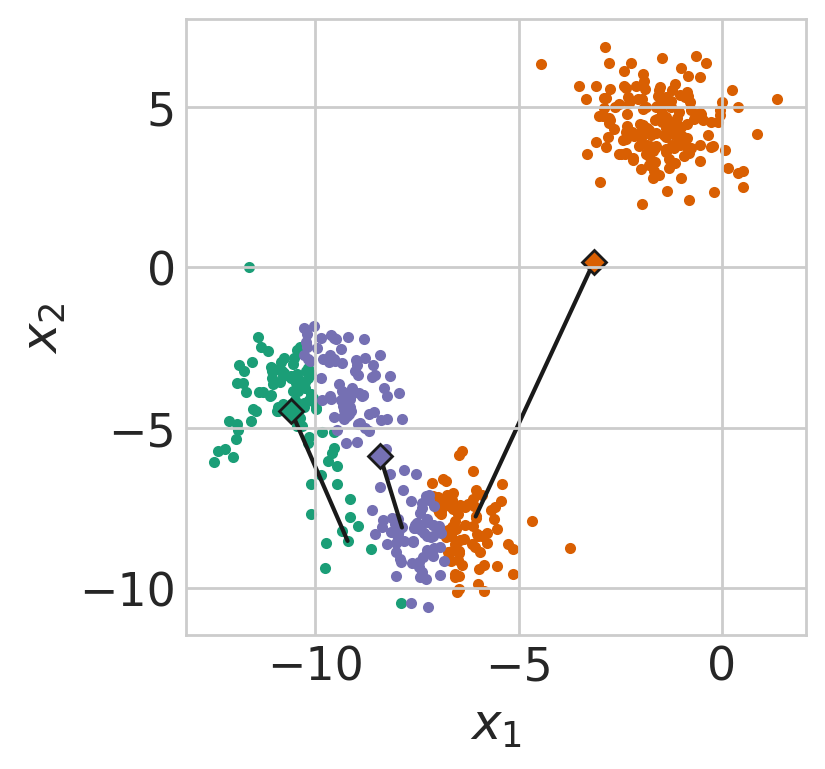

In [68]:
# plot the data set colored based on the cluster assignments, the new centers of the clusters, and how the cluster centers changed.

# create a figure with a single subplot, white background, and 200 dpi resolution
fig, axs = plt.subplots(figsize=(4., 4.), nrows=1, ncols=1, facecolor='white', dpi=200)

# iterate through each cluster and plot the data points, cluster center movement, and new cluster centers
for j in range(number_of_clusters):  
    # plot the data points assigned to the current cluster with specific colors
    axs.plot(X[predicted_cluster == j, 0], X[predicted_cluster == j, 1], marker='o', linewidth=0.0,
             markerfacecolor=qualitative_colors[j], markeredgecolor='none', markersize=4, zorder=-10)
    
    # plot a line connecting the initial and new cluster centers to show the movement
    axs.plot([centroids_initial[j, 0], centroids_new[j, 0]], [centroids_initial[j, 1], centroids_new[j, 1]], ls='-',
             color='k', zorder=0)
    
    # plot the new cluster center as a diamond marker with unique colors and black edge
    axs.plot(centroids_new[j, 0], centroids_new[j, 1], marker='D', markerfacecolor=qualitative_colors[j],
             markeredgecolor='k', zorder=0)

# label the x-axis with LaTeX-style formatting for variable x₁
axs.set_xlabel(r'$x_1$')

# label the y-axis with LaTeX-style formatting for variable x₂
axs.set_ylabel(r'$x_2$');


#### Step 3

#### Compute the distance between the old and the new cluster centers.

In [69]:
# define a function to perform the third step of K-means: calculating the distance between old and new cluster centers.
def calculate_difference_centers(c_new, c_old):
    """
    Calculate the distance between the old and the new cluster centers.
    
    Parameters
    ----------
    c_new : array_like
        Current centers of each cluster, shape (number of clusters, number of features).
    c_old : array_like
        Previous centers of each cluster, shape (number of clusters, number of features).
    
    Returns
    ----------
    differences : array_like
        Distance between the old and the new cluster centers, shape (number of clusters, 1).
    """
    
    # calculate the Euclidean distance between each new cluster center and its corresponding old cluster center
    differences = np.sqrt(np.power(c_new[:, 0] - c_old[:, 0], 2) + np.power(c_new[:, 1] - c_old[:, 1], 2))
    
    return differences  # return the array of distances


In [70]:
centroid_diff = calculate_difference_centers(centroids_new, centroids_initial)  # calculate the distances between the new and initial cluster centers

### Repeat Steps 1 - 3

#### until difference between the old and the new centroids is sufficiently small

In [71]:
def update_centroids(num, scatter_points, centroid_points, centroid_line, X):
    """Update the centroids in the animation."""
    global centroids_new                                                       # use the global variable centroids_new for updates
    if num == 1:                                                               # for the first frame
        centroids_new = rng.choice(X, size=n_clusters, replace=False, axis=0)  # randomly initialize new centroids
    elif num > 1:                                                              # for subsequent frames
        if num % 2 == 0:                                                       # if the frame number is even
            centroids = np.empty((n_clusters, 2))                              # create an empty array to store current centroid positions
            for j in range(n_clusters):                                        # iterate through each cluster
                centroids[j, :] = np.asarray(centroid_points[j].get_data()).flatten()  # extract current centroid coordinates
            y_predicted = calculate_nearest_cluster_center(X, centroids)               # assign data points to the nearest centroids
        if num % 2 == 1:                                                               # if the frame number is odd
            centroids = np.empty((n_clusters, 2))         # create an empty array to store current centroid positions
            for j in range(n_clusters):                   # iterate through each cluster
                centroids[j, :] = np.asarray(centroid_points[j].get_data()).flatten()  # extract current centroid coordinates
            y_predicted = calculate_nearest_cluster_center(X, centroids)               # assign data points to the nearest centroids
            centroids_new = calculate_cluster_mean(X, y_predicted)                     # recalculate the new centroids
            print(calculate_difference_centers(centroids_new, centroids))              # print the distances between new and old centroids

    if num > 0:                                                                        # for all frames after initialization
        for j in range(n_clusters):                                                    # iterate through each cluster
            if num > 1:  # If beyond the first frame
                scatter_points[j].set_data(X[y_predicted == j, 0], X[y_predicted == j, 1])  # update scatter plot data for points in the cluster
            if num % 2 == 0:                                                                # if the frame number is even
                centroid_points[j].set_data([centroids[j, 0]], [centroids[j, 1]])           # update the centroid position
            if num % 2 == 1:                                                                # if the frame number is odd
                                                                                            # ensure centroids_new is a valid sequence
                if not isinstance(centroids_new[j, 0], (list, np.ndarray)):
                    centroids_new = centroids_new.reshape(n_clusters, 2)                    # reshape centroids_new if needed
                centroid_points[j].set_data([centroids_new[j, 0]], [centroids_new[j, 1]])   # update the centroid position
                # Update the centroid movement lines
                centroid_line[j].set_data(
                    np.append(centroid_line[j].get_data()[0], centroids_new[j, 0]),
                    np.append(centroid_line[j].get_data()[1], centroids_new[j, 1])
                )

    return scatter_points, centroid_points, centroid_line        # return the updated scatter points, centroids, and lines


In [72]:
rng = np.random.default_rng(seed=21474836)  # initialize a random number generator with a fixed seed for reproducibility
n_clusters = 3                              # define the number of clusters (do not vary this value)
n_features = 2                              # define the number of features (dimensions) for the data points

# equal-Sized Blobs
X, y = make_blobs(n_samples=number_of_data_points, n_features=n_features, random_state=1)  # generate a dataset with equal-sized clusters

# Uncomment one of the following lines to experiment with different types of cluster shapes:

# Un-equal Sized Blobs
# X, y = make_blobs(n_samples=number_of_data_points, n_features=n_features, cluster_std=[1.0, 2.5, 0.5], random_state=3)  # Generate clusters with different standard deviations

# Asymmetrical Blobs
# X, y = make_blobs(n_samples=number_of_data_points, n_features=n_features, random_state=170)  # Generate clusters with random orientation
# X = np.dot(X, [[0.6, -0.6], [-0.4, 0.8]])  # Transform the dataset to create asymmetrical clusters


In [73]:
fig = plt.figure(figsize=(3.,3.), facecolor='white', dpi=200)  # create a figure with a size of 3x3 inches, white background, and 200 dpi resolution
axs = fig.add_subplot()                                        # add a single subplot to the figure (default: 1x1 grid)
n_iterations = 10                                              # define the number of iterations for the animation process

y_predicted = np.zeros(X.shape[0])  # initialize an array of zeros for predicted cluster assignments, one value for each data point

# create scatter plots for each cluster, initially showing no points, with unique colors for each cluster
scatter_points = [axs.plot(X[y_predicted==j,0], X[y_predicted==j,1], marker='o', markersize=4, markerfacecolor=qualitative_colors[j], linewidth=0.0, markeredgecolor='none', zorder=0)[0] for j in range(n_clusters)]

# create empty plots for the centroids of each cluster, to be updated during the animation
centroid_points = [axs.plot([ ], [ ], marker='D', markeredgecolor='k', markerfacecolor=qualitative_colors[j], zorder=0)[0] for j in range(n_clusters)]

# create empty line plots to show the movement of the centroids during the animation
centroid_line = [axs.plot([ ], [ ], c='k', linestyle='-', marker='', zorder=0)[0] for j in range(n_clusters)]

axs.set_xlabel(r'$x_1$')  # Label the x-axis with LaTeX-style formatting for variable x₁
axs.set_ylabel(r'$x_2$')  # Label the y-axis with LaTeX-style formatting for variable x₂

# create the animation object that updates the centroids and scatter points in each frame
ani = animation.FuncAnimation(
    fig, update_centroids, frames=2*n_iterations, fargs=(scatter_points, centroid_points, centroid_line, X), interval=200)

plt.close()  # close the plot to prevent it from being displayed immediately
ani          # return the animation object for rendering or displaying


[4.26755309 8.45721207 2.28486755]
[0.87860383 4.55888841 2.27405378]
[0.24498629 0.         0.40604428]
[0.01524748 0.         0.01696657]
[0. 0. 0.]
[0. 0. 0.]
[0. 0. 0.]
[0. 0. 0.]
[0. 0. 0.]


If the animation fails to work then watch this [YouTube video](https://www.youtube.com/watch?v=5I3Ei69I40s).

# Improving Models and Evaluation Paradigms

In [74]:
# import the libraries
import numpy as np                         # import NumPy for numerical operations
import matplotlib.pyplot as plt            # import Matplotlib for plotting
from matplotlib.ticker import MaxNLocator  # import MaxNLocator for controlling tick locations on plots
from matplotlib.lines import Line2D        # import Line2D for customizing plot legends and lines
import seaborn as sns                      # import Seaborn for enhanced data visualization
import pandas as pd                        # import Pandas for data manipulation and analysis

from sklearn.dummy import DummyClassifier     # import DummyClassifier for baseline classification models
from sklearn.metrics import confusion_matrix  # import confusion_matrix for evaluating model predictions
from sklearn.metrics import precision_score, recall_score, f1_score, accuracy_score  # import metrics for evaluating classification performance
from sklearn.model_selection import cross_val_score   # import cross_val_score for evaluating models using cross-validation
from sklearn.model_selection import train_test_split  # import train_test_split for splitting data into training and testing sets
from sklearn.preprocessing import StandardScaler      # import StandardScaler for standardizing features
from sklearn.neighbors import KNeighborsClassifier    # import KNeighborsClassifier for K-Nearest Neighbors classification
from sklearn.linear_model import LogisticRegression   # import LogisticRegression for logistic regression models
from sklearn.decomposition import PCA                 # import PCA (Principal Component Analysis) for dimensionality reduction


### Evaluation of Model Prediction 
Evaluating a model's predictions involves assessing how well the model performs on a dataset and how accurately it predicts the desired outcomes.
### Key Metrics for Model Evaluation
### 1. **Accuracy**
- **Definition**: The percentage of correctly predicted instances out of the total instances.
- **Formula**:
- $
  \
  \text{Accuracy} = \frac{\text{Number of Correct Predictions}}{\text{Total Number of Predictions}}
  \
  $
- **Use Case**: Works well when the dataset is balanced (equal distribution of classes).

### 2. **Precision**
- **Definition**: The percentage of true positive predictions among all positive predictions.
- **Formula**:
- $
  \
  \text{Precision} = \frac{\text{True Positives (TP)}}{\text{True Positives (TP)} + \text{False Positives (FP)}}
  \
  $
- **Use Case**: Important when false positives are costly (e.g., detecting diseases or fraud).

### 3. **Recall (Sensitivity)**
- **Definition**: The percentage of true positive predictions among all actual positive instances.
- **Formula**:
- $
  \
  \text{Recall} = \frac{\text{True Positives (TP)}}{\text{True Positives (TP)} + \text{False Negatives (FN)}}
  \
  $
- **Use Case**: Important when false negatives are costly (e.g., missing a cancer diagnosis).

### 4. **F1-Score**
- **Definition**: The harmonic mean of precision and recall, balancing the two metrics.
- **Formula**:
- $
  \
  \text{F1-Score} = 2 \cdot \frac{\text{Precision} \cdot \text{Recall}}{\text{Precision} + \text{Recall}}
  \
  $
- **Use Case**: Useful when you need a balance between precision and recall, especially for imbalanced datasets.
- 
### 5. **Confusion Matrix**
- **Definition**: A matrix summarizing the performance of a classification model.

|               | Predicted Positive | Predicted Negative |
|---------------|--------------------|--------------------|
| **Actual Positive** | True Positive (TP)    | False Negative (FN)   |
| **Actual Negative** | False Positive (FP)   | True Negative (TN)    |

- **Use Case**: Helps visualize the distribution of predictions and identify errors.

### 6. **ROC Curve and AUC**
- **ROC Curve**: Plots the True Positive Rate (Recall) against the False Positive Rate.
- **AUC (Area Under the Curve)**: Measures the ability of the model to distinguish between classes. Higher AUC indicates better performance.

### 7. **Cross-Validation**
- **Definition**: Splitting the dataset into multiple training and validation sets to evaluate the model on different data splits.

## Steps to Evaluate Model Predictions

1. **Split the Data**:
   - Divide your dataset into training, validation, and test sets.
   
2. **Train the Model**:
   - Fit the model to the training data.

3. **Make Predictions**:
   ```python
   y_pred = model.predict(X_test)        # Predicted class labels
   y_prob = model.predict_proba(X_test)  # Predicted probabilities



### **Example of Precision case**
#### Understanding True Positive (TP)

A **True Positive (TP)** refers to a prediction where the classifier correctly identifies a positive instance.

- **True**: The prediction matches the actual label.
- **Positive**: The instance belongs to the positive class.

#### Example: Disease Detection

Imagine a healthcare model that predicts whether a patient has a disease (**positive**) or not (**negative**). Here’s a dataset of 5 patients with their actual and predicted results:

| **Patient ID** | **Actual Disease Status** | **Predicted Status** | **Outcome**                     |
|-----------------|---------------------------|-----------------------|----------------------------------|
| 1               | Positive                 | Positive              | **True Positive (TP)**          |
| 2               | Negative                 | Positive              | **False Positive (FP)**         |
| 3               | Negative                 | Negative              | **True Negative (TN)**          |
| 4               | Positive                 | Negative              | **False Negative (FN)**         |
| 5               | Positive                 | Positive              | **True Positive (TP)**          |


#### Explanation of Outcomes

1. **Patient 1**:
   - **Actual Disease Status**: Positive (the patient has the disease).
   - **Predicted Status**: Positive (the model correctly predicts the disease).
   - **Outcome**: **True Positive (TP)**.

2. **Patient 2**:
   - **Actual Disease Status**: Negative (the patient does not have the disease).
   - **Predicted Status**: Positive (the model incorrectly predicts the disease).
   - **Outcome**: **False Positive (FP)**.

3. **Patient 3**:
   - **Actual Disease Status**: Negative (the patient does not have the disease).
   - **Predicted Status**: Negative (the model correctly predicts no disease).
   - **Outcome**: **True Negative (TN)**.

4. **Patient 4**:
   - **Actual Disease Status**: Positive (the patient has the disease).
   - **Predicted Status**: Negative (the model misses the disease).
   - **Outcome**: **False Negative (FN)**.

5. **Patient 5**:
   - **Actual Disease Status**: Positive (the patient has the disease).
   - **Predicted Status**: Positive (the model correctly predicts the disease).
   - **Outcome**: **True Positive (TP)**.

#### True Positive Count

- In this example:
  - **Patient 1** and **Patient 5** are **True Positives**.
  - Total **True Positives (TP)**: 2.
  - 
#### Metrics Involving True Positives

#### 1. **Precision**
- **Formula**:
  $
  \
  \text{Precision} = \frac{\text{TP}}{\text{TP} + \text{FP}}
  \
  $
- **Calculation**:
- $
  \
  \text{Precision} = \frac{2}{2 + 1} = \frac{2}{3} \approx 0.67 \, (67\%)
  \
  $
- **Interpretation**: Out of all predicted positive cases, 67% were correct.


#### 2. **Recall (Sensitivity)**
- **Formula**:
  $
  \
  \text{Recall} = \frac{\text{TP}}{\text{TP} + \text{FN}}
  \
  $
- **Calculation**:
- $
  \
  \text{Recall} = \frac{2}{2 + 1} = \frac{2}{3} \approx 0.67 \, (67\%)
  \
  $
- **Interpretation**: Out of all actual positive cases, 67% were correctly identified.

#### 3. **F1-Score**
- **Formula**:
- $
  \
  \text{F1-Score} = 2 \cdot \frac{\text{Precision} \cdot \text{Recall}}{\text{Precision} + \text{Recall}}
  \
  $
- **Calculation**:
- $
  \
  \text{F1-Score} = 2 \cdot \frac{0.67 \cdot 0.67}{0.67 + 0.67} \approx 0.67 \, (67\%)
  \
  $
- **Interpretation**: Balances precision and recall at 67%.

#### Visualizing True Positives

Imagine a decision boundary plot with points labeled as follows:
- **Blue Dots**: Actual Negative
- **Red Dots**: Actual Positive

If the red dots inside the classifier's "Positive" region are correctly classified, those are **True Positives**.

#### Key Takeaways

1. **True Positives (TP)** are instances where the model correctly predicts a positive case.
2. They are essential for evaluating metrics like Precision, Recall, and F1-Score.
3. In practical applications like disease detection or fraud detection, True Positives represent the successful identification of critical cases.


### The objective of Tutorial Functions 
Visualizes how a classifier (eg:K-NN) separates the feature space into regions for different classes. This function shows the followings:  
- Decision boundary (the lines separating different regions)
- Predicted probabilities for the classifier's confidence
- The original data points with their true labels

The function is doing the following :
- define plotting parameters
- create a mesh grid
- make predictions
- setup a plot
- plot grid points
- add decision boundary contours
- plot true data points
- create legends


In [1]:
## TUTORIAL FUNCTIONS
def plot_decision_boundary(x, y, clf):       # define a function to plot the decision boundary of a classifier

    # extract the features from the dataset
    x0 = x[:, 0]                             # first feature (e.g., PC1)
    x1 = x[:, 1]                             # second feature (e.g., PC2)

    PAD = 1.0                                # padding around the plot for better visualization
    H = 0.1                                  # mesh step size to create a grid for predictions
    PROB_DOT_SCALE = 40                      # scale factor for probability dot sizes
    PROB_DOT_SCALE_POWER = 3                 # exponential factor for scaling probability dots
    TRUE_DOT_SIZE = 50                       # size of the actual data points in the plot

    # determine the min and max values of x0 and x1, with padding
    x0_min, x0_max = np.round(x0.min()) - PAD, np.round(x0.max() + PAD)
    x1_min, x1_max = np.round(x1.min()) - PAD, np.round(x1.max() + PAD)

    # create axis ranges using mesh steps
    x0_axis_range = np.arange(x0_min, x0_max, H)
    x1_axis_range = np.arange(x1_min, x1_max, H)

    # generate a mesh grid for prediction
    xx0, xx1 = np.meshgrid(x0_axis_range, x1_axis_range)

    # flatten the mesh grid into a list of 2D points
    xx = np.reshape(np.stack((xx0.ravel(), xx1.ravel()), axis=1), (-1, 2))

    # predict cluster/class for each point in the grid
    yy_hat = clf.predict(xx)

    # predict probabilities for each point in the grid
    yy_prob = clf.predict_proba(xx)

    # calculate the size of probability dots based on predicted probabilities
    yy_size = np.max(yy_prob, axis=1)

    # set font properties for the plot
    font = {'size': 10}

    plt.rc('font', **font)  # apply the font settings

    # create the figure and axes for the plot
    plt.style.use('seaborn-v0_8-whitegrid')                              # set a clean style for the plot
    fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(18, 10), dpi=150)  # define figure size and resolution

    # define color scheme for the plot
    redish = '#d73027'
    orangeish = '#fc8d59'
    yellowish = '#fee090'
    blueish = '#4575b4'
    colormap = np.array([redish, blueish, orangeish])  # array of colors for classes

    # plot the grid points, with colors based on predictions and sizes based on probabilities
    ax.scatter(xx[:, 0], xx[:, 1], c=colormap[yy_hat], alpha=0.4,
               s=PROB_DOT_SCALE * yy_size ** PROB_DOT_SCALE_POWER, linewidths=0)

    # add decision boundary contours
    ax.contour(x0_axis_range, x1_axis_range,
               np.reshape(yy_hat, (xx0.shape[0], -1)),
               levels=3, linewidths=1,
               colors=[redish, blueish, blueish, orangeish])

    # plot the original data points with true labels
    ax.scatter(x[:, 0], x[:, 1], c=colormap[y], s=TRUE_DOT_SIZE, zorder=3,
               linewidths=0.7, edgecolor='k')

    # get the axis limits for the plot
    x_min, x_max = ax.get_xlim()
    y_min, y_max = ax.get_ylim()

    # add labels and a title to the plot
    ax.set_ylabel("PC1")  # Label for the y-axis
    ax.set_xlabel("PC2")  # Label for the x-axis
    ax.set_title(f"Decision Boundary for $k$={clf.n_neighbors}")  # Title showing the value of k in k-NN

    # create a legend for class labels
    legend_class = []
    for bball_positions, color in zip(['Center', 'Forward', 'Guard'], [blueish, redish, orangeish]):
        legend_class.append(Line2D([0], [0], marker='o', label=bball_positions, ls='None',
                                   markerfacecolor=color, markersize=np.sqrt(TRUE_DOT_SIZE),
                                   markeredgecolor='k', markeredgewidth=0.7))

    # create a legend for probabilities
    prob_values = [0.4, 0.6, 0.8, 1.0]  # Example probabilities
    legend_prob = []
    for prob in prob_values:
        legend_prob.append(Line2D([0], [0], marker='o', label=prob, ls='None', alpha=0.8,
                                  markerfacecolor='grey',
                                  markersize=np.sqrt(PROB_DOT_SCALE * prob ** PROB_DOT_SCALE_POWER),
                                  markeredgecolor='k', markeredgewidth=0))

    # add the class legend to the plot
    legend1 = ax.legend(handles=legend_class, loc='center',
                        bbox_to_anchor=(1.15, 0.35),
                        frameon=False, title='class')

    # add the probability legend to the plot
    legend2 = ax.legend(handles=legend_prob, loc='center',
                        bbox_to_anchor=(1.15, 0.65),
                        frameon=False, title='"prob"')

    ax.add_artist(legend1) # ensure the class legend remains visible

    ax.grid(False)         # disable gridlines for a cleaner appearance

    # Force x and y axis ticks to be integers
    ax.xaxis.set_major_locator(MaxNLocator(integer=True))
    ax.yaxis.set_major_locator(MaxNLocator(integer=True))

    ax.set_aspect(1)       # set equal aspect ratio for x and y axes

    plt.show()             # Display the plot


## Introduction





Evaluations are intended to serve at least one and probably more of the following goals:



*   To provide a point estimate of a model's performance
*   To provide information about the variance around that point estimate
*   To find the "best" parameters for a given model
*   To determine which of several models (given particular parameters) is the "best"


In this workshop, I will give an introductory overview of evaluation in machine learning that will touch on each of these, and I will cover some common pitfalls on these topics.

**Standard caveat--Your mileage may vary**

### Why High Variance Indicates Overfitting or Sensitivity to Training Data ?
High variance in a machine learning model typically means that the model performs well on the training data but struggles to generalize to new, unseen data.    
**Variance** refers to how much the model's predictions change when it's exposed to different datasets or splits of the data.  
**High variance** means that the model is overly sensitive to the specific details of the training data and produces inconsistent results when applied to other datasets.



### Explanation of the Evaluation Goals in Machine Learning   
Evaluations in machine learning are essential for understanding how well a model performs and for making decisions about model selection, tuning, and deployment.
- To Provide a Point Estimate of Model's Performance: A point estimate is a single value summarizing how well the model performs on a dataset. Accuracy, Precision,Recall, F1-score,AUC, and ROC give quick sense of the model's overall performance.
- To provide Information About the Variance Around The Point Estimate: While a point estimate gives an average performance, variance tells us how much the performance fluctuates across the different datasets or splits.
- To Find the Best Parameters for a Given Model : Many machine learning models have parameters (or hyperparameters) that need to be tuned for optimal performance.
- To Determine Which of Several Models is the "Best": Comparing the performance of multiple models (e.g., Logistic Regression, Random Forests, Neural Networks) to choose the best one.
---
### Examples of Hyperparameters
- k-Nearest Neighbors (k-NN):  
Hyperparameter: Number of neighbors (k).   
Small k: High variance (model overfits).  
Large k: High bias (model underfits).
- Decision Trees:    
Hyperparameters:Maximum tree depth.  
Minimum number of samples per leaf.  
These control the tree's complexity and prevent overfitting.
- Logistic Regression:  
Hyperparameter: Regularization strength (C).  
Large C: Weak regularization (risk of overfitting).  
Small C: Strong regularization (risk of underfitting).  
- Neural Networks:  
Hyperparameters:Number of layers and neurons per layer.  
Learning rate (step size in weight updates).  
Batch size.  



### Explanation of Hyperparameters
- Hyperparameters are settings or configurations that are set before training the model and cannot be learned from the data.
- They control aspects of the model, such as its complexity, how it learns, or how predictions are made.

## Part I: Metrics

### Classification Metrics
**Accuracy** is the number of correct predictions divided by the total number of predictions made

<br/><br/>


\text{Accuracy} = $$ \frac{\text{# Correct Predictions}}{\text{Total # of Predictions}} $$


<br/><br/>

Imagine that we are trying to build a model to filter out spam email. The following data contains the text of email messages along with their actual type (i.e., label). "Ham" messages constitute real email messages whereas "spam" messages are, well, spam.  

###  Explanation of Classification Metrics
**Classification metrics** are used to evaluate the performance of a classification model by comparing its predictions against the actual labels. These metrics help us understand how well the model is performing in terms of making correct predictions.

In [76]:
# load the dataset from a URL into a Pandas DataFrame
spam_ham = pd.read_csv("https://raw.githubusercontent.com/PrincetonUniversity/intro_machine_learning/main/day2/sms_spam.csv")
spam_ham = spam_ham[['type']] # select only the 'type' column (contains labels like 'spam' or 'ham')
spam_ham.head()               # display the first few rows of the DataFrame to inspect the data


,type
0,ham
1,ham
2,ham
3,spam
4,spam


If we have a quick look at the type column, we can see that most messages are ham.

In [77]:
# group the data by the 'type' column and count the number of occurrences for each type
counts_df = spam_ham[['type']].groupby(['type']).size().reset_index(name='outcome_counts')

# display the resulting DataFrame containing the counts of each type
counts_df


,type,outcome_counts
0,ham,4812
1,spam,747


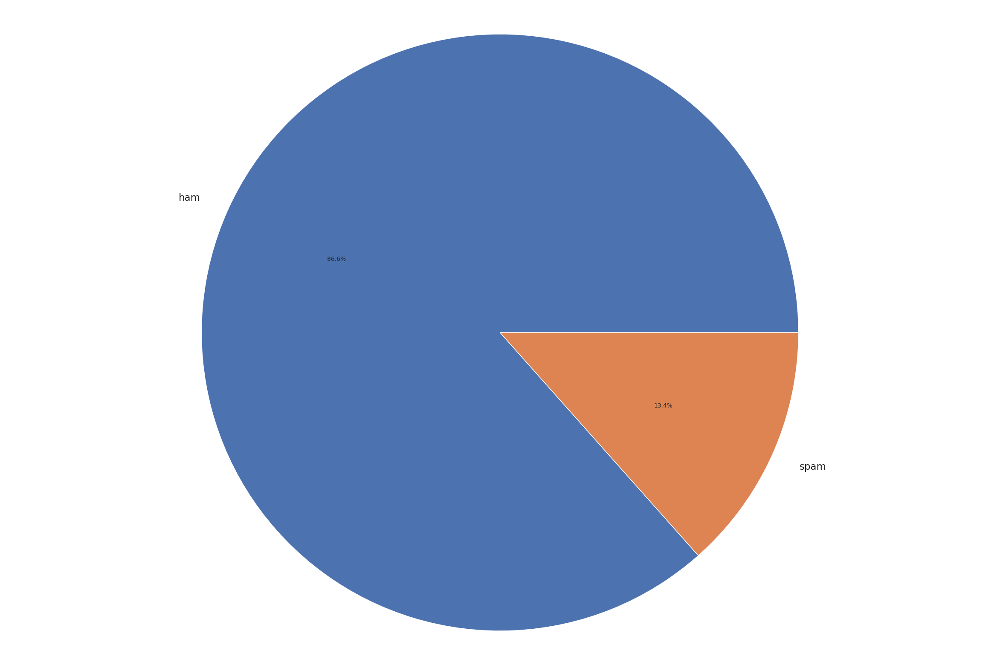

In [78]:
fig1, ax1 = plt.subplots()                                                         # create a new figure and axes object for the pie chart
ax1.pie(counts_df['outcome_counts'], labels=counts_df['type'], autopct='%1.1f%%')  # create a pie chart using the 'outcome_counts' column,
                                                                                   # with labels from the 'type' column
ax1.axis('equal')                                                                  # set the aspect ratio to 'equal' to ensure the pie
                                                                                   # chart appears as a circle 
plt.show()                                                                         # display the pie chart


Using this data, we can build a very simple classifier, which just predicts the majority class. In other words, the classifier will always predict "ham."  

In [79]:
dummy_clf = DummyClassifier(strategy="most_frequent")          # create a DummyClassifier that always predicts the most frequent class
dummy_clf.fit(np.zeros(spam_ham.size), spam_ham[['type']])     # fit the dummy classifier; features are ignored, so we pass an array of
                                                               # zeros for the input
dummy_predictions = dummy_clf.predict(np.zeros(spam_ham.size)) # make predictions using the dummy classifier

# calculate the accuracy of the dummy classifier and round it to 3 decimal places
accuracy = round(accuracy_score(spam_ham[['type']], dummy_predictions), 3)
# print the accuracy of the dummy classifier
print(f'Accuracy of majority class model is: {accuracy}')


Accuracy of majority class model is: 0.866


Judging by overall accuracy alone, we might conclude that the dummy classifier is doing a decent job. But of course, this is is not a good model since it never predicts "spam," which is what we are actually trying to get the model to do correctly. Whenever we are thinking about designing an evaluation strategy, we have to consider what we actually care about. Just going with a default metric could work, or it could end up prioritizing an outcome at the expense of whatever you care about. As always, subject matter expertise is critical when developing a good machine learning pipeline at each stage of the development process from data collection/selection all the way through to evaluation.

In our case, we are trying to develop a model that will allow us to detect and filter out spam. Therefore, we need to make sure our evaluation strategy makes sense for doing so even though it is the minority class. So, let's talk about some more granular strategies for assessing model performance.

A **confusion matrix** is used for classification models. It allows us to break down our results in terms of true positives, true negatives, false positives, and false negatives. This gives us a better sense of the kinds of errors our model is making.
<br/><br/>

|            | Predicted true | Predicted false |
|------------|----------------|-----------------|
|Actual true | True Positive  | False Negative  |
|Actual false| False Positive | True Negative   |

<br/><br/>

Accordingly, we can reframe our formula for accuracy as

$$\text{Accuracy} = \frac{TP + TN}{TP + TN + FP + FN}$$
<br/><br/>

We can create a confusion matrix from our dummy model model

In [80]:
cm = confusion_matrix(spam_ham[['type']], dummy_predictions)  # generate the confusion matrix comparing true labels with dummy predictions
cm = np.flip(cm)                                              # flip the confusion matrix so that 'spam' is treated as the positive case

# convert the confusion matrix into a Pandas DataFrame with meaningful row and column labels
cm_df = pd.DataFrame(cm,
               columns=['predicted_spam', 'predicted_ham'],  # column names for predictions
               index=['actual_spam', 'actual_ham'])          # row names for actual labels
cm_df                                                        # display the DataFrame to view the confusion matrix


,predicted_spam,predicted_ham
actual_spam,0,747
actual_ham,0,4812


In this case, we'll consider "spam" the positive case since that is what we are trying to detect. So, cases where the model predicted "ham" but the message was actually "spam" are false negatives. We have 747 of these cases.

Because the dummy classifier always predicts "ham," there are no cases where the model predicted "spam" and the actual outcome was "ham;" however, if it had, those would constitute false positives.

Even though our model performed well in terms of overall accuracy, we can see from the confusion matrix that it performed abysmally in terms of false negatives. In machine learning, overall accuracy provides a poor measure of a model's performance when we have a "class imbalance," meaning one label occurs much more frequently than the other(s).



Often with machine learning, we neither want a model that is too conservative in predicting the positive class nor too aggressive. Two metrics that help us assess this are precision and recall

<br/><br/>
**Precision** captures what proportion of the model's prediction of the positive class actually belong to the positive class. In other words, of all the times the model predicted the positive class, how often was that prediction correct?

$$\text{Precision} = \frac{TP}{TP + FP}$$

<br/><br/>

**Recall** captures the proportion of cases that actually belong to the positive class were predicted as positive by the model. In other words, of all the actual positive cases, how many did we correctly predict?

$$\text{Recall} = \frac{TP}{TP + FN}$$


<br/><br/>
A precise model will only predict the positive class when the example is very likely to be positive. A model that has high recall will capture a large proportion of the actual positive examples.

We will calculate precision and recall for our dummy classifier, but first we need to do some minor modifications on our predictions to make this possible. If we attempt to calculate these metrics from just the majority class predictions, we'll get into some divide by zero issues for precision since we have no spam predictions.

I'll demonstrate this below, just to show you.

In [81]:
TP = cm_df.loc['actual_spam', 'predicted_spam']  # extract the True Positive (TP) count from the confusion matrix
TN = cm_df.loc['actual_ham', 'predicted_ham']    # extract the True Negative (TN) count from the confusion matrix
FP = cm_df.loc['actual_ham', 'predicted_spam']   # extract the False Positive (FP) count from the confusion matrix
FN = cm_df.loc['actual_spam', 'predicted_ham']   # extract the False Negative (FN) count from the confusion matrix
print(f'Precision is {TP / (TP + FP)}')          # calculate and print the precision (TP / (TP + FP))
print(f'Recall is {TP / (TP + FN)}')             # calculate and print the recall (TP / (TP + FN))


Precision is nan
Recall is 0.0


/tmp/ipykernel_1081738/3577532443.py:6: RuntimeWarning: invalid value encountered in scalar divide
  print (f'Precision is {TP/(TP + FP)}')


Okay. For illustrative purposes, we'll add a few additional observations to our dataset that will allow us to calculate these metrics.

In [82]:
# create a new DataFrame with additional spam and ham labels
new_data = pd.DataFrame(['spam', 'spam', 'spam', 'spam',
                         'spam', 'spam', 'ham', 'ham'], columns=['type'])

# Create a new array with predictions for the additional data (all predicted as spam)
new_predictions = np.array(['spam', 'spam', 'spam', 'spam',
                            'spam', 'spam', 'spam', 'spam'])

# Concatenate the original DataFrame with the new data
new_spam_ham = pd.concat([spam_ham, new_data], ignore_index=True)

# Append the new predictions to the original dummy predictions
new_dummy_predictions = np.append(dummy_predictions, new_predictions)

# Generate a new confusion matrix for the combined data
new_cm = confusion_matrix(new_spam_ham[['type']], new_dummy_predictions)

# Flip the confusion matrix so that 'spam' is treated as the positive case
new_cm = np.flip(new_cm)

# Convert the updated confusion matrix into a Pandas DataFrame with meaningful labels
new_cm_df = pd.DataFrame(new_cm,
               columns=['predicted_spam', 'predicted_ham'],  # Column labels for predictions
               index=['actual_spam', 'actual_ham'])          # Row labels for actual labels

# Display the updated confusion matrix
new_cm_df


,predicted_spam,predicted_ham
actual_spam,6,747
actual_ham,2,4812


Our new confusion matrix reveals that we have 6 true positives, 4812 true negatives, 2 false positives, and 747 false negatives. With these, we can now calculate precision and recall.

In [83]:
# Extract the True Positive (TP) count from the updated confusion matrix
TP = new_cm_df.loc['actual_spam', 'predicted_spam']

# Extract the True Negative (TN) count from the updated confusion matrix
TN = new_cm_df.loc['actual_ham', 'predicted_ham']

# Extract the False Positive (FP) count from the updated confusion matrix
FP = new_cm_df.loc['actual_ham', 'predicted_spam']

# Extract the False Negative (FN) count from the updated confusion matrix
FN = new_cm_df.loc['actual_spam', 'predicted_ham']

# Calculate precision (TP / (TP + FP)) for the updated data
dc_precision = TP / (TP + FP)

# Calculate recall (TP / (TP + FN)) for the updated data
dc_recall = TP / (TP + FN)

# Print the calculated precision
print(f'Precision is {dc_precision}')

# Print the calculated recall
print(f'Recall is {dc_recall}')



Precision is 0.75
Recall is 0.00796812749003984


Precision is better than recall. We just added 8 instances of the model "predicting" spam, with 6 of those being correct (6/8 = 0.75). So, the predictions are reasonably precise.

What our predictions do not do well is cover all the actual instances of spam in the dataset. This is captured in our recall measure, which is very low. Again, this is because our predictions do not capture (i.e., correctly predict) most of the actual spam examples.

Precision and recall can tell us a lot about how our model is performing, but it's nice to have a single summary statistic as well. The F1 Score combines precision and recall using the harmonic mean.

**F1 score** is the harmonic mean of precision and recall.


$$\text{F}_1 = 2 \cdot \frac{\text{precision} \cdot \text{recall}}{\text{precision} + \text{recall}}$$

In [84]:
# Calculate the F1-score using the formula: 2 * (Precision * Recall) / (Precision + Recall)
dc_F1 = 2 * ((dc_precision * dc_recall) / (dc_precision + dc_recall))

# Print the calculated F1-score
print(f'F1 is: {dc_F1}')


F1 is: 0.01576872536136662


Since the F1 score captures aspects of both precision and recall, the overall assessment reflects that this is not a good model.

Note, we can also calculate all these metrics using the metrics functionality of `scikit-learn`.

In [85]:
# Add a new binary column 'pos_case' to the DataFrame, where 'spam' is encoded as 1 and 'ham' as 0
new_spam_ham['pos_case'] = np.where(new_spam_ham['type'] == 'spam', 1, 0)

# Convert the dummy predictions into a binary format, where 'spam' is 1 and 'ham' is 0
new_dummy_predictions_binary = np.where(new_dummy_predictions == 'spam', 1, 0)

# Calculate the F1-score using the true binary labels and binary predictions
f1_score(new_spam_ham[['pos_case']], new_dummy_predictions_binary)


0.01576872536136662

There are many other metrics for evaluating classification models. Techniques that may be a particular help for visualizing results are precision recall curves or receiver operating characteristic (ROC) curves. [Applied Predictive Modeling](http://appliedpredictivemodeling.com/) by Kuhn & Johnson contains a good explanation of these methods.

### Regression Metrics

So far we have only discussed metrics for evaluating classification models, but of course, there are metrics for evaluating regression models as well. Several metrics that are commonly used include mean absolute error, mean squared error, and root mean squared error. In the formulas below, $y_i$ is the actual value for observation i and $\hat{y}_i$ is the predicted value for observation $i$. To illustrate, we'll mock up a quick linear regression and plot it.

### Explanation of Regression Metrics
Regression metrics are used to evaluate the performance of a regression model, which predicts a continious numerical value rather than a categorical label. These metrics quantify how well the model's predictions match the actual target values.

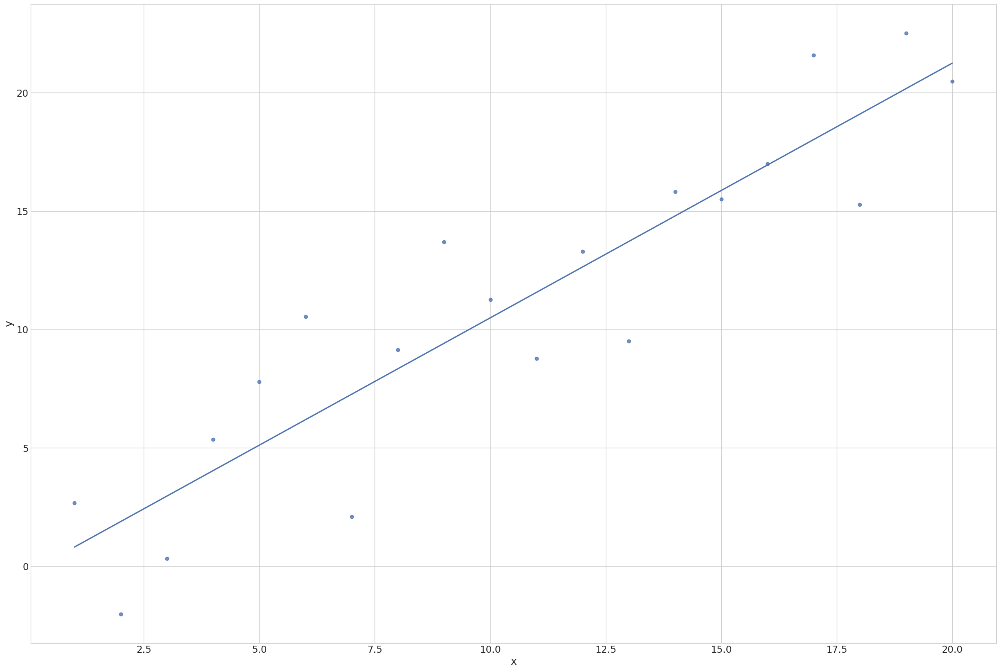

In [86]:
# create an array of integers from 1 to 20 (independent variable)
x = np.arange(1, 21)

# generate random noise from a normal distribution with mean 0 and standard deviation 3
noise = np.random.normal(0, 3, len(x))

# create the dependent variable 'y' by adding noise to 'x'
y = x + noise

# create a Pandas DataFrame containing the independent and dependent variables
df = pd.DataFrame.from_dict({'x': x, 'y': y})

# plot a regression line and scatter plot using the DataFrame with no confidence interval
sns.regplot(data=df, x='x', y='y', ci=None)

# Optionally, set the lower limit of the y-axis to 0 (currently commented out)
# plt.ylim(bottom=0)

# Optionally, set the left limit of the x-axis to 0 (currently commented out)
# plt.xlim(left=0)

# Display the plot
plt.show()


**Mean Absolute Error** (MAE) is the mean of the absolute value of the errors:

$$\frac{1}{N}\sum_{i=1}^N|y_i-\hat{y}_i|$$

**Mean Squared Error** (MSE) is the mean of the squared errors:

$$\frac{1}{N}\sum_{i=1}^N(y_i-\hat{y}_i)^2$$

**Root Mean Squared Error** (RMSE) is the square root of the mean of the squared errors:

$$\sqrt{\frac{1}{n}\sum_{i=1}^n(y_i-\hat{y}_i)^2}$$





As with regression in the context of null hypothesis significance testing, we can see the residuals between the regression line and the actual data points. Because the errors could be in the positive or negative direction, we cannot simply use the difference between the data point and the regression line; we need a method for making all of the errors positive. Using the absolute value of the error as in mean absolute error (MAE) is one way to do this. Mean sqaured error (MSE) and root mean squared error (RMSE) are also ways of doing this. Several other regression metrics also exist, but for brevity, we will not discuss them here. As always, which metric you use should be informed by an understanding of the domain as well as your model choices.

## Evaluation Paradigms

Thus far, we have discussed evaluation without diving into which data our metrics are calculated on. In machine learning, we train a model on one dataset with the goal of making accurate predictions in another dataset. In other words, we aim to create a model that has good generalization. Our evaluation metrics should ideally give us a good sense of how well our model would perform on data it has never "seen" before. We will explore several different strategies for training and evaluating models that have different implications for generalization (some good and some not so good).

First, let's load some new data.


In [87]:
# load the NBA player statistics dataset from the provided URL into a Pandas DataFrame
nba = pd.read_csv("https://raw.githubusercontent.com/PrincetonUniversity/intro_machine_learning/main/day2/nba_player_statistics.csv")
# display the first few rows of the DataFrame to inspect its structure and data
nba.head()


,ast,stl,blk,tov,pf,pts,name,position,team
0,1.941176,0.917647,0.229412,1.088235,2.023529,11.088235,Wesley Matthews,SG,LAL
1,1.133333,0.233333,0.050000,0.516667,0.950000,2.650000,Justin Robinson,PG,OKC
2,1.071429,0.414286,0.128571,0.500000,1.171429,5.057143,Rodney McGruder,SG,DET
3,0.200000,0.172727,0.072727,0.327273,0.990909,1.554545,Anthony Gill,PF,WAS
4,0.825000,0.300000,0.850000,0.600000,1.800000,4.725000,Goga Bitadze,C,IND


The data we will be using for the next section of the workshop contains statistics for NBA players, drawn from www.basketball-reference.com, albeit in modified form. The data reflects players' per-season averages for several key metrics. As an example, if a player averaged 10 points per game in their first season, and 20 points per game in their second season, their per-season average points per game is 15.

The per-season average statistics we will be using are the following:

* **AST** - Assists
* **BLK** - Blocks
* **PF** - Personal Fouls
* **PTS** - Points
* **STL** - Steals
* **TOV** - Turnovers

Using these statistics, we will use KNN classification to predict players' positions. As a quick refresher, the overarching idea in KNN is that for each example we want to classify, we take the *k* examples whose features are most similar to the new example, and apply whatever label the majority of them have. To determine which examples are most similar, we calculate the distance between the example we are trying to classify and all other examples in our dataset. We often use the Euclidean distance for this, though some other distances are sometimes used. The following formula captures the Euclidean distance for two points *p* and *q*:

$$d\left( p,q\right)   = \sqrt {\sum _{i=1}^{n}  \left( q_{i}-p_{i}\right)^2 }$$

The data from www.basketball-reference.com classifies players positions as point guard (PG), shooting guard (SG), power forward (PF), small forward (SF), and center (C). For simplicity, we will collapse those into three categories: guards, forwards, and centers. We'll map those to numeric values in our dataset such that centers=0, forwards=1, and guards=2.

In [88]:
# map positions to numbers
nba['pos_num'] = nba.position.map({'C':0, 'SF':1, 'PF':1, 'SG':2, 'PG':2})

To create the model, we'll be using the `scikit-learn` library. To train a model, we'll need to separate out our feature columns (i.e., the basketball stats) from our labels (i.e., the player's position).

In [89]:
#create feature data set
X = nba[['ast', 'stl', 'blk', 'tov', 'pf', 'pts']]

# create response vector (y)
y = nba.pos_num

Let's take a look at the number of players that fall into each position category:

In [90]:
# group the data by the 'pos_num' column and count the number of occurrences for each unique value
count_df = nba[['pos_num']].groupby(['pos_num']).size().reset_index(name='outcome_counts')

# display the first few rows of the resulting DataFrame to inspect the grouped counts
count_df.head()


,pos_num,outcome_counts
0,0,82
1,1,171
2,2,194


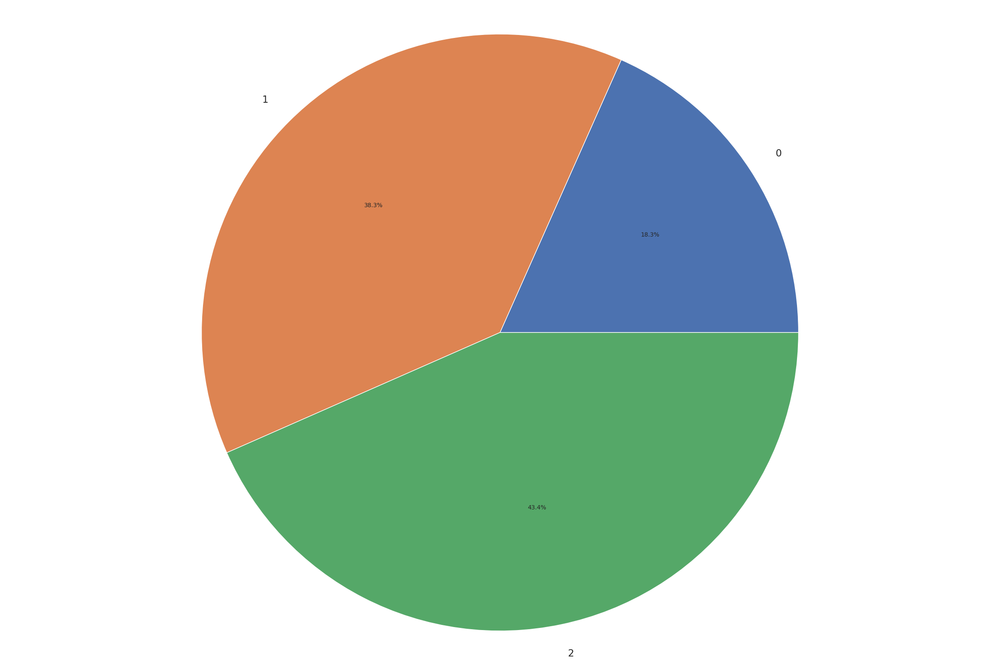

In [91]:
fig1, ax1 = plt.subplots()
ax1.pie(count_df['outcome_counts'], labels=count_df['pos_num'], autopct='%1.1f%%')
ax1.axis('equal')

#Reminder: centers=0, forwards=1, and guards=2
plt.show()

As with the spam and ham data we started with, we have a class imbalance in our labels. It is not nearly as severe, but still worth bearing in mind as we calculate our model performance metrics. Note that the metrics we walked through earlier, in their most basic implementation, deal with binary classification tasks. These measures are slightly more complicated for multi-class classification, but it is still possible to calculate them. For brevity, we will not go into that here, but you can check out the `scikit-learn` [documentation](https://scikit-learn.org/stable/modules/generated/sklearn.metrics.f1_score.html) on this to learn more

Before we begin fitting our model, we need transform our features so that they exist on the same scale. Why is this the case? Well, first, let's have a quick look at the data:

array([[<Axes: title={'center': 'ast'}>, <Axes: title={'center': 'stl'}>],
       [<Axes: title={'center': 'blk'}>, <Axes: title={'center': 'tov'}>],
       [<Axes: title={'center': 'pf'}>, <Axes: title={'center': 'pts'}>]],
      dtype=object)

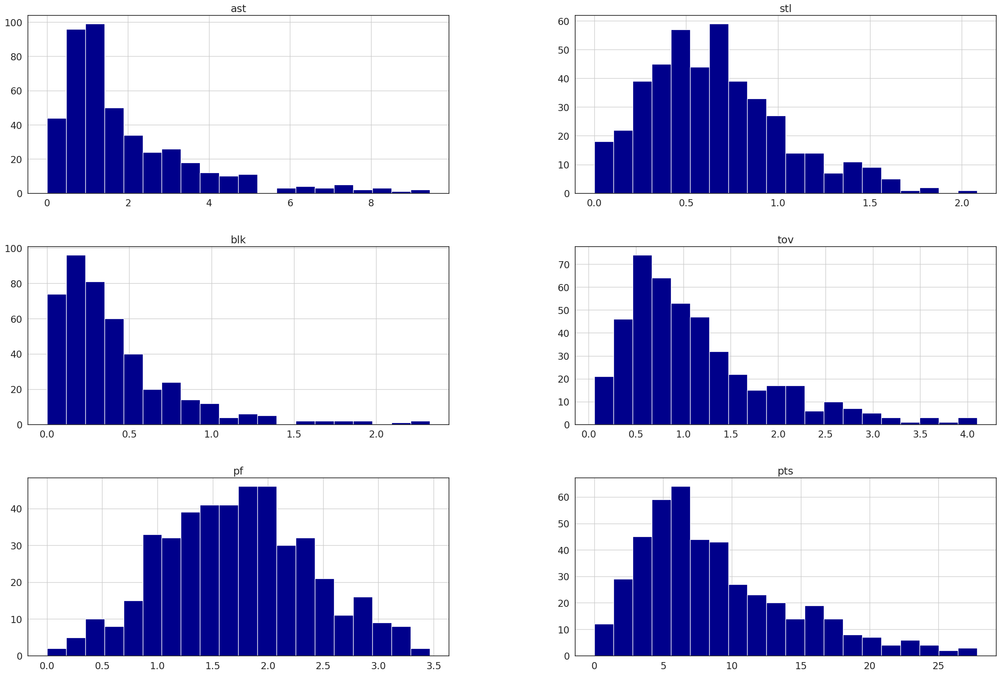

In [92]:
# feature plotting
sns.set(style='white',font_scale=1.5, rc={'figure.figsize':(30,20)})
X.hist(bins=20,color='darkblue' )

The range of some of the features is much larger than others. When we're using KNN, we classify examples using their distance to other examples. If some features have a much large range than others, they will tend to dominate this distance calculation, minimizing the impact of features with smaller ranges. For our algorithm, we'll make use of the `StandardScaler` class in `scikit-learn`, and it's default scaling method, which is [z-scoring](https://en.wikipedia.org/wiki/Standard_score). Note that in the cell below, scaling has been performed across all of our input data. This is not advisable, but I will come back to that in a bit.

In [93]:
#Scale all the data. Not advisable. More on that later.
scaler = StandardScaler()
scaler.fit(X)
X_scale = scaler.transform(X)

### Train on all the data

One method for fitting and evaluating models would be to develop a model that is maximally accurate on our entire dataset and report the accuracy as calculated on all the data.


This is known as training accuracy because we are evaluating the model on the same data we used to train the model.

Let's look at an example of this process. We'll start with a model that uses the top 10 nearest neighbors to classify each example using all the training data for the entire process.

In [94]:
# instantiate the model
knn = KNeighborsClassifier(n_neighbors=10)

# train the model on the entire dataset
knn.fit(X_scale, y)

# store the predicted response values
y_pred_class = knn.predict(X_scale)

print (accuracy_score(y, y_pred_class))

0.7404921700223713


In terms of overall training accuracy, this is a decent model. But can we make it even better? Let's try with a smaller k...


In [95]:
# instantiate the model
knn = KNeighborsClassifier(n_neighbors=5)

# train the model on the entire dataset
knn.fit(X_scale, y)

# store the predicted response values
y_pred_class = knn.predict(X_scale)

print (accuracy_score(y, y_pred_class))

0.7829977628635347


And an EVEN SMALLER k...

In [96]:
# instantiate the model
knn = KNeighborsClassifier(n_neighbors=1)

# train the model on the entire dataset
knn.fit(X_scale, y)

# store the predicted response values
y_pred_class = knn.predict(X_scale)

print (accuracy_score(y, y_pred_class))

1.0


We have obtained PERFECT accuracy. Yay! Just kidding, this isn't actually a good thing. Intuitively, it probably makes sense to you that this is an unrealistically optimistic estimate of our model's future performance. In the case of *k*=1, the model is able to obtain perfect accuracy because when we use every example to fit the model, the nearest neighbor to every example is itself:

$$d(p,p)=0$$


In [97]:
neigh_dist, neigh_ind = knn.kneighbors(X_scale, 1)
for i in range(6):
    print(f'Index of nearest neighbor for example {i} is {neigh_ind[i]}')

Index of nearest neighbor for example 0 is [0]
Index of nearest neighbor for example 1 is [1]
Index of nearest neighbor for example 2 is [2]
Index of nearest neighbor for example 3 is [3]
Index of nearest neighbor for example 4 is [4]
Index of nearest neighbor for example 5 is [5]


By fitting our model on all our data and evaluating performance on this same dataset, we have created a model that captures our training data perfectly, but is unlikely to generalize to new data (i.e., we have overfit to the training data). To provide a visualization of this, we'll use a decision boundary plot. This kind of plot allows us to look at how the model makes decisions about which class to predict.

Because we have more than two features, we will use PCA$^1$ to collapse our feature data into two dimensions for visualization purposes.

[1] For a great explanation of PCA at several levels of technical detail, see [this classic post](https://stats.stackexchange.com/questions/2691/making-sense-of-principal-component-analysis-eigenvectors-eigenvalues)

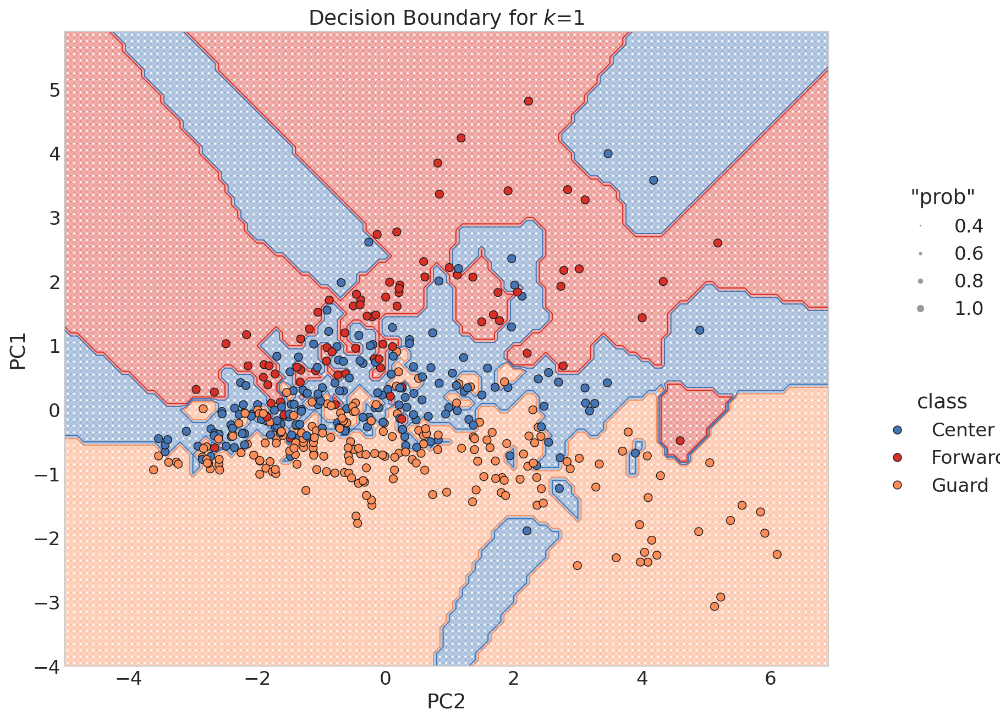

In [98]:
pca = PCA(n_components = 2)
x = pca.fit_transform(X_scale)
knn = KNeighborsClassifier(n_neighbors=1)
knn.fit(x, y)


plot_decision_boundary(x, y, knn)

This plot looks pretty ridiculous. Although it fits our training data perfectly (because each example was predicted using itself), it is unlikely that new examples that were not in our training data are likely to fit this same very complex pattern exactly.

Thus, we need a better way to estimate the **out-of-sample performance** of our model, both so that we have a (more) realistic estimate of how our model will perform and so that we can choose a reasonable value for *k*.

### Train/Test Splits
One alternative approach is to partition your dataset into two subsets. You train your model on one subset (i.e., the training set) and evaluate your model in the other (i.e., the test set). The model's performance on the test set is referred to as the **testing accuracy** because we are evaluating the model on an (in theory) independent dataset that was not used during model training. For this reason, testing accuracy is usually a better estimate of out-of-sample performance than training accuracy.



We can use the built-in functionality in `scikit-learn` to split our data into training and testing sets. Note that in the code below, we **do not** run our scaler on the entire dataset and then split it, but rather, we first split the data, fit the scaler to the training data, then apply it to the train and test sets.

In [99]:
# STEP 1: split X and y into training and testing sets (using random_state for reproducibility)
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=98, test_size=0.20)

# STEP 2: Create a scaler, fit to the TRAINING data and apply to train and test
scaler = StandardScaler()
# # Fit only on X_train
scaler.fit(X_train)

# # Scale both X_train and X_test
X_train = scaler.transform(X_train)
X_test = scaler.transform(X_test)

# STEP 3: train the model on the training set (using K=1)
knn = KNeighborsClassifier(n_neighbors=1)
knn.fit(X_train, y_train)

# STEP 4: test the model on the testing set, and check the accuracy
y_pred_class = knn.predict(X_test)
print (f'accuracy is {accuracy_score(y_test, y_pred_class)}')

# compute null accuracy
print(f'null accuracy is {y_test.value_counts().head(1).item() / len(y_test)}')


accuracy is 0.5333333333333333
null accuracy is 0.4444444444444444


So, when we use only the single nearest neighbor in the training set to predict the class in the test set, the model performs pretty poorly, especially when we look at what the null accuracy, the accuracy we could achieve by just predicting the majority class. Let's look again at a boundary plot using predictions in the test set based only on each test data point's single closest neighbor in the training set.

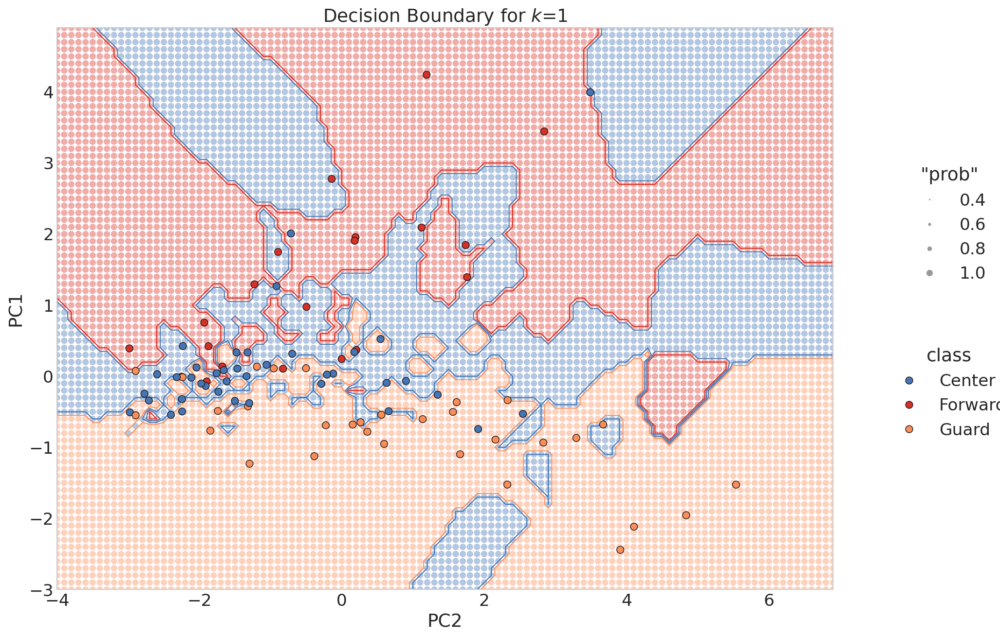

In [100]:
pca = PCA(n_components = 2)
pca.fit(X_train)

X_train = pca.transform(X_train)

X_test = pca.transform(X_test)
knn = KNeighborsClassifier(n_neighbors=1)
knn.fit(X_train, y_train)

plot_decision_boundary(X_test, y_test, knn)

Not nearly so good. And, in a lot of those places where the decision boundary is very tailored, the model made a mistake predicting the outcome. This demostrates one form of what we refer to as "overfitting," when we create a model that performs very well on one dataset (usually the training data), but is unlikely to generalize to the actual scenario we care about (See also [this post](https://www.quora.com/What-is-an-intuitive-explanation-of-over-fitting-particularly-with-a-small-sample-set-What-are-you-essentially-doing-by-over-fitting-How-does-the-over-promise-of-a-high-R%C2%B2-low-standard-error-occur/answer/Jessica-Su) for an explanation of overfitting)

Ok, so maybe we can just choose a really large value for k? Let's see what that looks like.

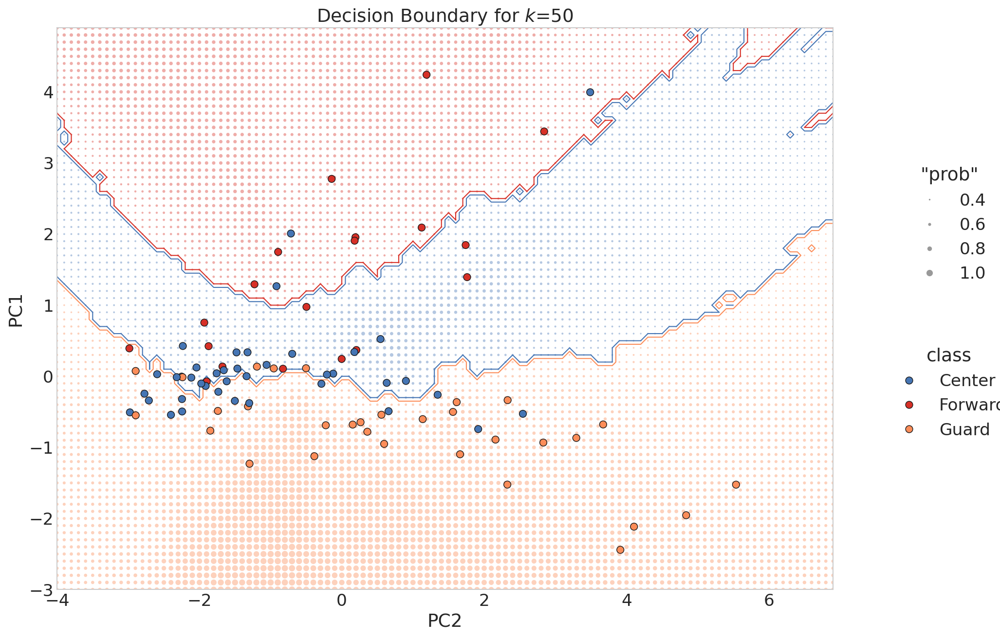

In [101]:
knn = KNeighborsClassifier(n_neighbors=50)
knn.fit(X_train, y_train)

plot_decision_boundary(X_test, y_test, knn)

This value of k makes many mistakes. It is an underfit model. So, how do you know what value of k to select? Glad you asked. First, we'll do the following. We will fit the model with a range of k values (1 to 50) on the training data, then evaluate performance in the test set using the k nearest neighbors in the training set. For illustrative purposes, we will also evaluate performance on the training data.

In [102]:
k_range = range(1, 51)
training_error = []
testing_error = []

for k in k_range:

    # instantiate the model with the current K value
    knn = KNeighborsClassifier(n_neighbors=k)

    # calculate training error
    knn.fit(X_train, y_train)
    y_pred_class = knn.predict(X_train)
    training_accuracy = accuracy_score(y_train, y_pred_class)
    training_error.append(1 - training_accuracy)

    # calculate testing error
    knn.fit(X_train, y_train)
    y_pred_class = knn.predict(X_test)
    testing_accuracy = accuracy_score(y_test, y_pred_class)
    testing_error.append(1 - testing_accuracy)


In [103]:
# create a DataFrame of K, training error, and testing error
column_dict = {'K': k_range, 'training error':training_error, 'testing error':testing_error}
df = pd.DataFrame(column_dict).set_index('K').sort_index(ascending=False)

First, we will plot only the test error.

Text(0, 0.5, 'Error (lower is better)')

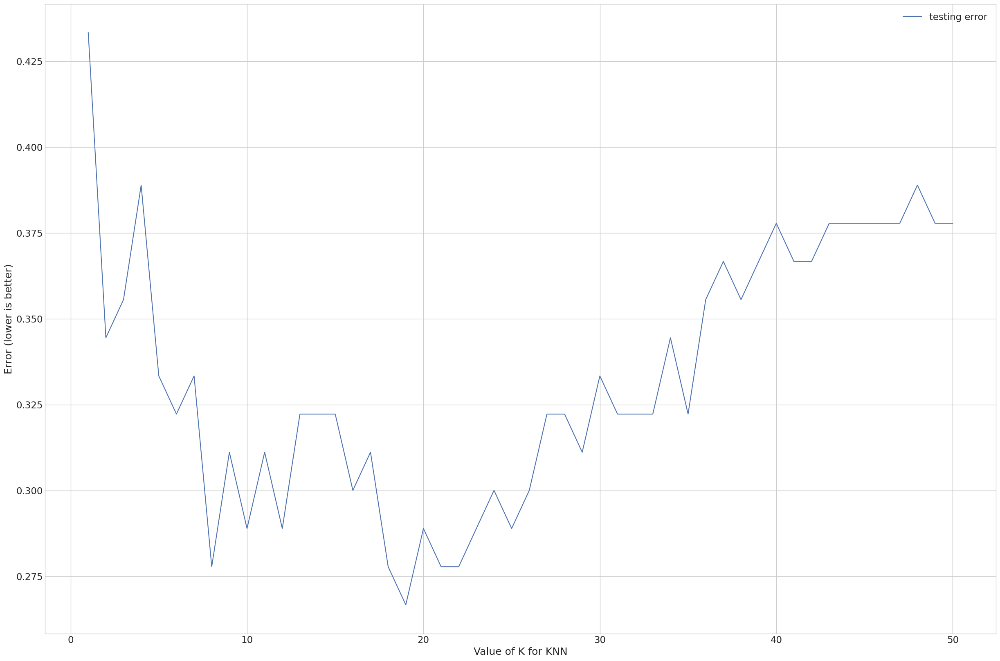

In [104]:
# plot the relationship between K (HIGH TO LOW) and TESTING ERROR
df=df.sort_index(ascending=True)
df.head()
df.plot(y='testing error')
plt.xlabel('Value of K for KNN')
plt.ylabel('Error (lower is better)')

We can see from the plot that the error (generally) decreases as we increase k to a point, then begins to increase again.

In [105]:
# find the minimum testing error and the associated K value
df.sort_values('testing error', ascending=True).head(10)

,training error,testing error
K,,
19,0.291317,0.266667
22,0.280112,0.277778
21,0.280112,0.277778
18,0.280112,0.277778
8,0.252101,0.277778
23,0.280112,0.288889
20,0.285714,0.288889
12,0.266106,0.288889
10,0.257703,0.288889


In [106]:
1-0.266667

0.733333

When using KNN on this dataset with these features, the best value for K is likely to be somewhere near 20.
Given the statistics of an unknown player, we estimate that we would be able to correctly predict his position about 73% of the time. How would this compare if we looked only at performance on the training data? Let's have a look.

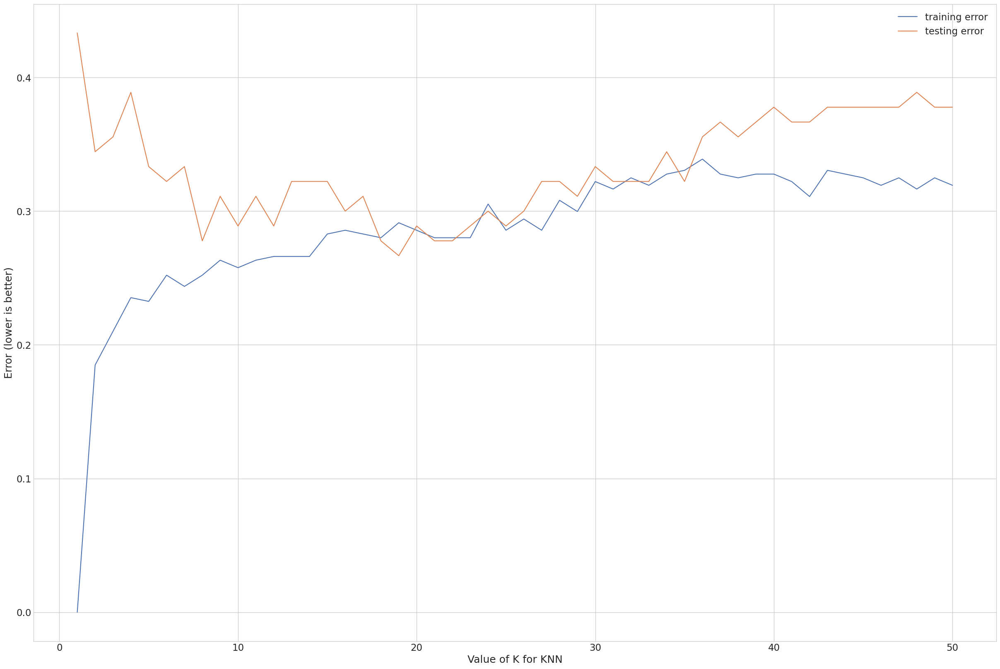

In [107]:
# plot the relationship between K (from k=50 to k=1) and both training and testing error
df.plot()
plt.xlabel('Value of K for KNN')
plt.ylabel('Error (lower is better)')
plt.show()

We can see from the plot that as k approaches zero, the error on the training dataset continues to decrease whereas it begins to increase on the test data.

**Other recommendations for train-test splitting**


*   Use a splitting strategy so that the distribution of the outcome in the test set mirrors that of the training set.
*   Use a splitting strategy that mirrors the conditions in which the model will actually or would theoretically be deployed. Subject matter expertise can be helpful here.



In the previous section we have shown that:
1. When hyperparameters are selected based on performance assessed on a test set, the model is more likely to generalize than if we determined them using all of our data.
2. Estimates of performance on a test set are likely to be much more realistic (i.e., less optimistic) than if we assessed on all of our data.

But this approach still has disadvantages. The performance estimates are still based on a single possible split of our data. What would happen if the `train_test_split` function had split the data differently? We'll try this by using a different random seed than the one we started with.

In [108]:
# try different values for random_state
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=96, test_size=0.20)
# STEP 2: Create a scaler, fit to the TRAINING data and apply to train and test
scaler = StandardScaler()
# # Fit only on X_train
scaler.fit(X_train)

# # Scale both X_train and X_test
X_train = scaler.transform(X_train)
X_test = scaler.transform(X_test)

knn = KNeighborsClassifier(n_neighbors=19)
knn.fit(X_train, y_train)
y_pred_class = knn.predict(X_test)
print (accuracy_score(y_test, y_pred_class))

0.6222222222222222


As you probably would have guessed, our model estimate is not the same with a different random seed. Train/test split is useful because of its flexibility and speed, but testing accuracy is a high-variance estimate of out-of-sample accuracy. K-fold cross-validation overcomes this limitation and provides more information about the range of possible performance our model would achieve. Note that in the examples below, we will use all the data we have to perform cross validation. If you want to do some form of model tuning/selection in addition to getting accuracy estimates, this is probably not ideal for reasons we will touch on later.

### K-fold cross validation

#### Steps for K-fold cross-validation
1. Split the dataset into K equal partitions (or "folds").
2. Use fold 1 as the testing set and the union of the other folds as the training set.
3. Calculate testing accuracy.
4. Repeat steps 2 and 3 K times, using a different fold as the testing set each time.
5. Use the average testing accuracy as the estimate of out-of-sample accuracy.

**Diagram of 5-fold cross-validation:**

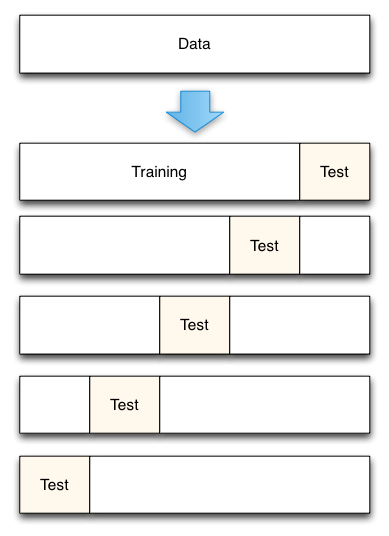!

In [109]:
knn = KNeighborsClassifier(n_neighbors=19)
scores = cross_val_score(knn, X_scale, y, cv=5)
print(f"accuracy scores per fold are {np.round(scores,3)}. Average accuracy: {round(scores.mean(),3)}")

accuracy scores per fold are [0.711 0.756 0.685 0.64  0.584]. Average accuracy: 0.675


By using k-fold cross validation, we get a better sense of what we might expect the average model performance to be, given a training and testing dataset of the size we used in the procedure. While the number of estimates we have is small, we also do get some sense of the variance of performance estimates.

### Comparing cross-validation to train/test split

**Advantages of cross-validation:**

* More accurate estimate of out-of-sample accuracy
* More "efficient" use of data (every observation is used for both training and testing)

**Advantages of train/test split:**

* Runs K times faster than K-fold cross-validation
* Simpler to examine the detailed results of the testing process (but you could build this out yourself to get more insight)


**Cross-validation recommendations**
* K can be any number, but K=10 is generally recommended provided you have a reasonable amount of data
* For classification problems, stratified sampling (i.e., each set contains approximately the same percentage of samples of each target class as the complete set) is recommended for creating the folds. Depending on your model and which function you are using, `scikit-learn` may do this by default. Be sure to consult the documentation to double check. You also may want to consider if some additional dependencies (e.g., time) that mirror the situation in which you want to deploy the model might be wise for structuring cross-validaton. Random/random + stratified is not always the best strategy.
* Use nested cross validation (details below)

### Cross-validation for parameter tuning

In many machine learning models, multiple parameters must be set. Cross-validation can be used to determine what value to use for the parameter (or set of parameters). In our case, the parameter we are trying to find the best value for is k. This is conceptually similar to what we did using the train/test split method in which we computed the accuracy on the test set using different values of k. Here, we will get a more reliable estimate of the performance across values of k since we will be testing on more than one dataset.


In [110]:
# search for an optimal value of K for KNN
k_range = range(1, 31)
k_scores = []
k_min = []
k_max = []
for k in k_range:
    knn = KNeighborsClassifier(n_neighbors=k)
    scores = cross_val_score(knn, X_scale, y, cv=5, scoring='accuracy')
    k_scores.append(scores.mean())
    k_min.append(scores.min())
    k_max.append(scores.max())


Text(0.5, 1.0, 'Mean and Range of Accuracy from Cross-Validation')

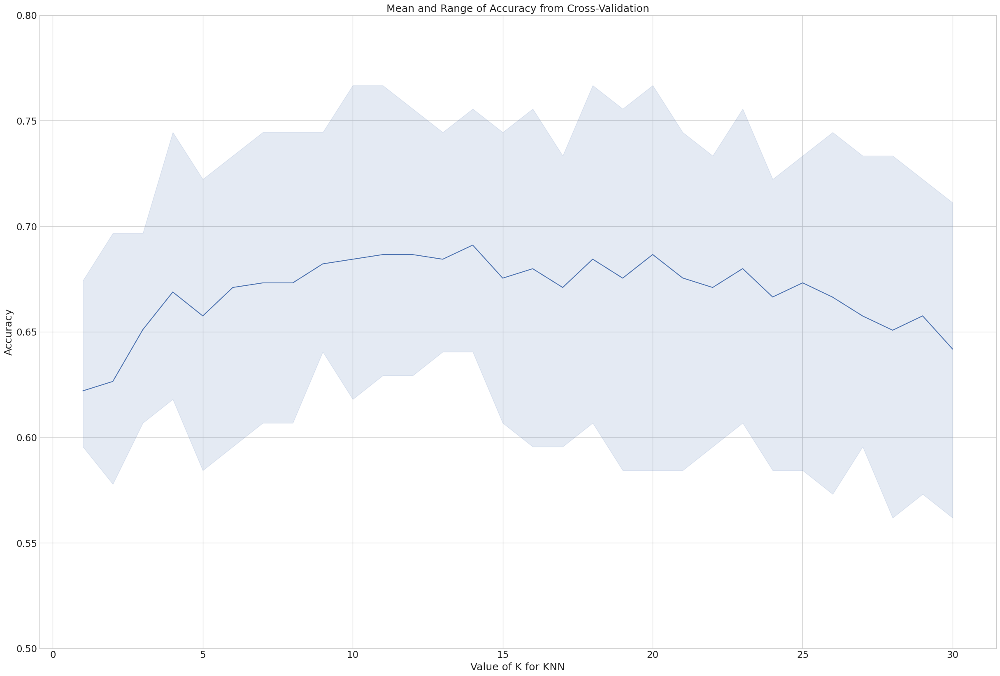

In [111]:
fig, ax = plt.subplots()
ax.plot(k_range, k_scores)
ax.fill_between(
    k_range, k_min, k_max, color='b', alpha=.15)
ax.set_ylim(ymin=.5, ymax=.8)
plt.xlabel('Value of K for KNN')
plt.ylabel('Accuracy')
plt.title('Mean and Range of Accuracy from Cross-Validation')

### Cross-validation for model selection
In addition to parameter selection for a single ML model, we can also use cross-validation to evaluate several candidate models. Here, we will compare the best KNN model with logistic regression.

In [112]:
# 5-fold cross-validation with the best-ish KNN model
knn = KNeighborsClassifier(n_neighbors=19)
knn_cv_score = cross_val_score(knn, X_scale, y, cv=5, scoring='accuracy')

# 5-fold cross-validation with logistic regression
logreg = LogisticRegression()
lr_cv_score = cross_val_score(logreg, X_scale, y, cv=5, scoring='accuracy')

print(f'KNN has mean accuracy of {round(knn_cv_score.mean(),3)} with a standard deviation of {round(knn_cv_score.std(),3)}')
print(f'Logistic regression has mean accuracy of {round(lr_cv_score.mean(),3)} with a standard deviation of {round(lr_cv_score.std(),3)}')


KNN has mean accuracy of 0.675 with a standard deviation of 0.059
Logistic regression has mean accuracy of 0.705 with a standard deviation of 0.044


###Train-Validation-Test/Holdout Method
Progressively throughout this tutorial, we have moved closer and closer to best practices for evaluating models. However, there are still some cases, particularly for scientific papers, where we have remaining issues. Consider the case of the train/test method (with repeated model iteration) and with cross-validation to select parameters and/or compare models. If our goal is to deploy a model into a (low-risk) industry setting, this might be sufficient because after the model is deployed, we can evaluate it through additional online methods (e.g., A/B testing) or by re-calcluating our ML metrics again on data collected post deployment. By doing this, we have in effect created a new dataset for evaluation that is wholly independent from the data used to train the model since that data did not even exist when the model was built. We can then use information about our deployed model performance to iteratively improve it. In academic research contexts, the output is often static (e.g., in a paper published in a journal, which does not get updated). Thus, to generate an honest assessment of our model performance, we need to create a dataset that is *never used in the training process* on which to conduct the final performance evaluation.

In the train-validation-test method, we separate out a portion of our data that we will not use at all for other steps in the evaluation process. We can then conduct all of the steps we have already discussed using the data that was not withheld for the final test set. For example, of the remaining data, we will split it again into a training and validation set (or into multiple training and validation sets within cross validation), performing all steps of our evaluation. In most cases, once we have selected our best ML algorithm and determined which parameters to use with that model, we then train the model again using those selections on all the data in both the training and validation sets. Then as the final step, we test our model on the test data we withheld at the beginning and did not touch again.

You might be wondering how all this can be accomplished given that you don't have a ton of data to work with to begin with. **Nested cross-validation** is a strategy that may well be a good idea to embrance anyway, but it can be particularly helpful if you have a small dataset. This is a bit difficult to explain quickly, so at the end of this notebook, I have included snippets from Peter Ramadge's machine learning course documents and a recommended YouTube video. They contains a good explanation of nested cross validation.

In the next cell, I have provided a visual representation of this process.



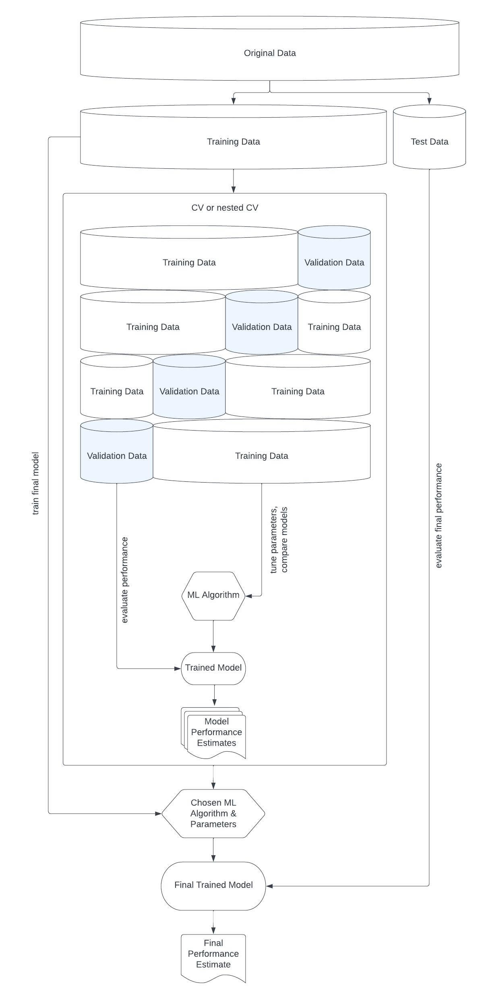

### Avoiding evaluation pitfalls

There are a number of pitfalls we want to avoid when evaluating machine learning models. We will touch briefly on some here, but I highly recommend both `scikit learn`'s [documentation on pitfalls](https://scikit-learn.org/stable/common_pitfalls.html) and Michael Lones' excellent, easy to understand [guide](https://arxiv.org/pdf/2108.02497.pdf), which I'll draw bits and pieces from below. Princeton recently held a [workshop on reproducibility](https://sites.google.com/princeton.edu/rep-workshop/) in science using machine learning, which also has great suggestions on how to improve your research.


**Leakage**:

> *Data leakage is a spurious relationship between the independent variables and the target variable that arises as an artifact of the data collection, sampling, or pre-processing strategy. Since the spurious relationship won’t be present in the distribution about which scientific claims are made, leakage usually leads to inflated estimates of model performance [Kapoor & Narayanan, 2022](https://arxiv.org/pdf/2207.07048.pdf)*

A commonly told cautionary tale about leakage:

> *Tomaso Poggio⁠, the director of M.I.T.’s Center for Brains, Minds and Machines, offered a classic parable used to illustrate this disconnect. The Army trained a program to differentiate American tanks from Russian tanks with 100% accuracy. Only later did analysts realized that the American tanks had been photographed on a sunny day and the Russian tanks had been photographed on a cloudy day. The computer had learned to detect brightness ([Murphy, 2017](https://www.nytimes.com/2017/10/09/science/stanford-sexual-orientation-study.html))*

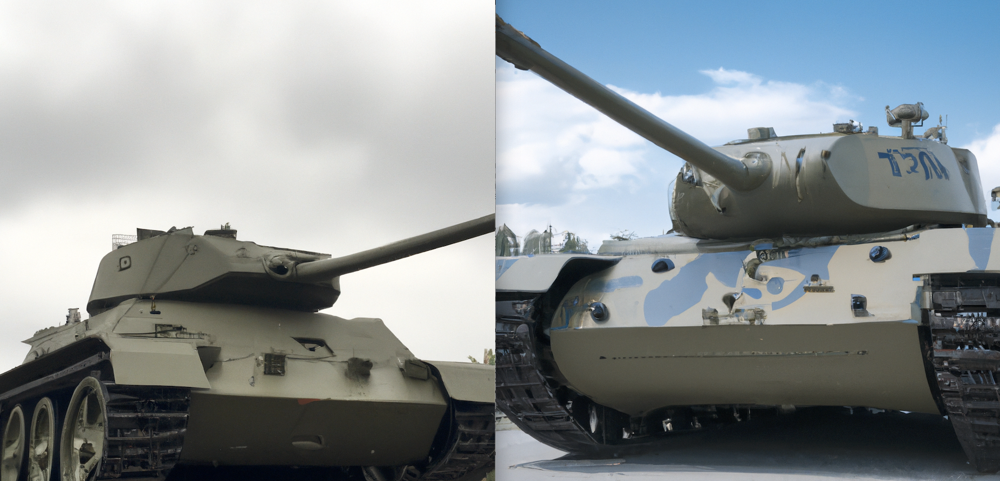

<div style="text-align: right">
    Bizzare tanks care of DALL-E https://labs.openai.com/
</div>


Despite being widely referenced, there has been [debate](https://www.gwern.net/Tanks) about whether this actually ever happened or even could happen. Still, the urban legend offers an easy to understand example of data leakage--if there is an artifact in the data collection process that is confounded with the outcome/target/response variable, estimates of model accuracy will be inflated compared to a real-world scenario where the confound is not present.

Think about this as being similar to experimental design. As much as possible, we want to minimize any differences between our treatment and control groups to ensure that our results have internal validity (and ideally, external validity).



*   **Don't look at ALL of your data**: A common piece of advice when developing machine learning models is to explore and visualize aspects of your dataset before doing anything else. This advice is generally helpful for informing the choices you make later about your model (e.g., featurization, imputation, etc.), but can also be a source of leakage. If you do exploratory analyses on **all** of your data, you have essentially gained information into your test data that could bias your model in ways that artificially inflate performanc estimates.

*   **Don't do feature selection on ALL your data**
There can be a lot of preprocessing steps in the machine learning process. In fact, these steps may constitute the bulk of your effort. Taking care (and leveraging subject matter expertise) in your preprocessing steps can dramatically improve your model performance, but sometimes these steps dramatically improve your model performance artificially. One way this can happen is if you select features or make choices about how to encode features using all your data. If you do this, implicit information about your test set will have leaked into your data before you even start training a model. Therefore, you should always make sure you set aside an appropriate holdout set **before** performing feature selection.

*   **Don't do data augmentation on ALL your data**
Like featurization and data exploration, augmentation procedures can be a source of leakage. For example, sometimes it makes sense to impute (i.e., fill in) null values where they exist in your dataset. If the strategy you use to determine which values to impute is based on all your data, this can be a source of leakage. For example, you might choose to impute null values in a feature based on that feature's mean. When you determine the mean, it should be based **only** on your training data. Then you can use the mean of the training data to impute the value in your test data. A similar approach also goes for the generation of synthetic data. Sometimes when data has severe class imbalance, techniques that generate synthetic data points that emulate the real data can be useful (e.g., [SMOTE](https://learn.microsoft.com/en-us/azure/machine-learning/component-reference/smote)). But, synthetic data should be developed to resemble the **training data only** not the entire dataset.

*   **Do report multiple metrics**
It's a good idea to report multiple metrics to allow the reader to better understand how your model performed. As one example we have already touched on, if your data has a class imbalance, accuracy alone is not an adequate measure of the model's performance. You will also need to include metrics that are less sensitive to class imbalances. Along similar lines, be very transparent about which metrics you are reporting. For example, if you provide an estimate of area under the curve (AUC) be clear about whether this AUC is from an ROC curve or a precision-recall curve. It is also often a good idea to report metrics at multiple stages in the process.

*   **Do use a legitimate baseline(s)**
In science, when we make a claim about something being good, we usually mean relative to something else that is less good. It's tempting to choose a strawman baseline that does not provide a legitimate comparison to your chosen modeling approach. Doing this anyway can result in [distortions in the scientific record](https://dl.acm.org/doi/abs/10.1145/3434185), which can also bleed into industry applications.

###Other considerations:
The following definitions are drawn from psychology, but they still apply in machine learning.
1. **Construct validity**: The extent to which your measure accurately assesses what it is intended to measure.
2. **Content validity**: The extent to which an instrument or metric covers all relevant parts of the construct it aims to measure.
3. **Fairness/ethical ramifications**: Especially in domains that touch humans in some way, we also may care about whether the model itself or aspects of the modeling process have ethical ramifications. There are some mathematical methods and tools for evaluating specific fairness criteria in particular contexts, but if your model interacts with humans, you would do well to at least consider whether some ethical quantitative/qualitative assessment should also be a part of your evaluation process.

### Nested Cross Validation

Earlier I mentioned that nested cross validation is a process that can overcome biases in non-nested cross validation that inflate performance estimates. We can use the k-fold method in the diagram below for hyperparameter selection, model training, and model testing. The steps to nested cross validation are as follows:

* Partition the entire training dataset into k balanced folds. Then use an outer loop to evaluate classifier performance for a given hyperparameter value. The outer loop iterates through the k folds by training on k − 1 folds, and testing on the corresponding left-out fold. This approach results in k estimates of model performance. This is the outer loop. If this doesn't make sense yet, read the rest of the procedure for the inner loops and come back. It makes more sense when you understand what else is going on.


* Inside the outer loop, we place two inner loops. At the start of each of the above k iterations, we place a selection loop that iterates through a designated set of hyperparameter values. For each value, we train and evaluate the resulting classifier.


* Here is where we use a third innermost loop. The simplest way to implement this inner loop is to use k − 2 of the k − 1 current training folds as the training subset and the left-aside fold of the present training folds as the validation subset. After the inner loop, we obtain k − 1 estimates of performance, yielding an assessment of the average performance of the current model and the spread of its performance about the average.


* After training and evaluating each hyperparameter value, we select the “best” value. We can then train the model using the selected value on all of the k − 1 folds of the current training data. Then report its performance on the left-out test fold. At the end of the k iterations in the outer loop, we have k best hyperparameter value selections and k sets of performance metrics.

This scheme is both complex and computationally expensive. However, it is appealing when training data is in short supply.

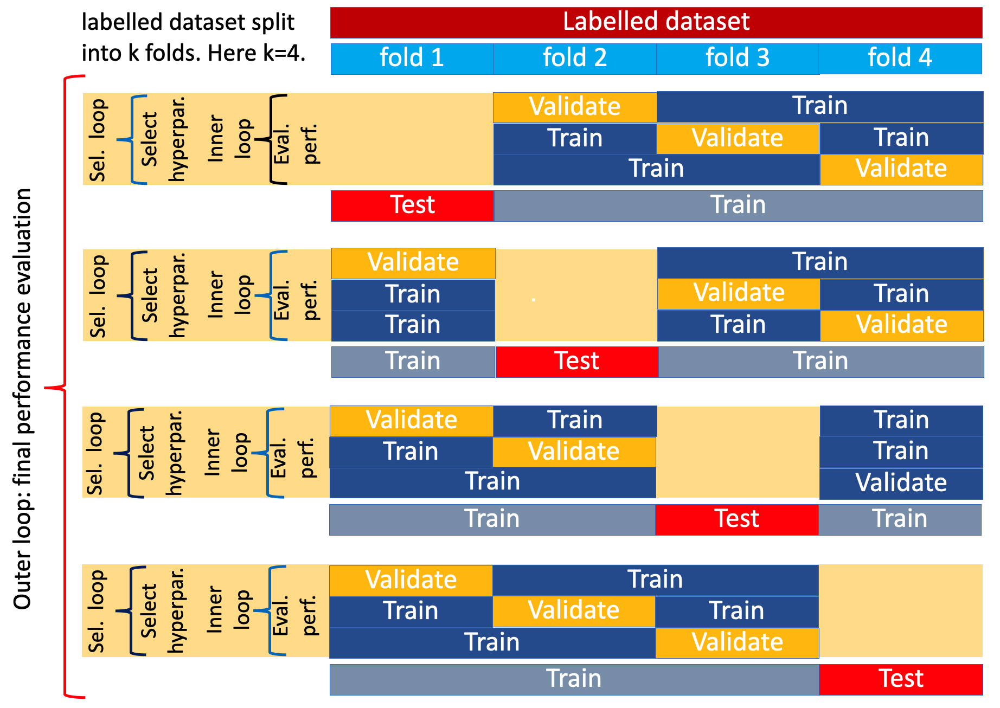

You can also check out [this video](https://www.youtube.com/watch?v=XXFLFWHP9Nc) from Sebastian Raschka, which also provides a pretty good explanation of this.

<font size="1">

**Notes on source material**
    
* Much of this workshop notebook draws heavily from [this notebook](https://github.com/justmarkham/DAT8/blob/master/notebooks/09_model_evaluation.ipynb) because it contains a great explaination of evaluation paradigms. Some material was also adapted from maykulkarni's machine learning notebooks [repo](https://github.com/maykulkarni), and other parts were (lightly) adapted from [this tutorial](https://stackabuse.com/k-nearest-neighbors-algorithm-in-python-and-scikit-learn/). Parts of the cross-validation section are adapted from [this notebook](https://github.com/justmarkham/DAT8/blob/master/notebooks/13_cross_validation.ipynb)
    
* The rad decision boundary plot was adapted from [this post](https://www.tvhahn.com/posts/beautiful-plots-decision-boundary/)

* The NBA data for the KNN example was generated using the [basketball reference scraper repo](https://github.com/vishaalagartha/basketball_reference_scraper) to scrape NBA statistics from the website https://www.basketball-reference.com. Source data extracted using this repo were transformed into their current format by adapting code from [this tutorial](https://towardsdatascience.com/simple-modeling-of-nba-positions-using-the-k-nearest-neighbors-machine-learning-algorithm-223b8addb08f) on KNN. You can access my complete code for generating the data [here](https://github.com/amywinecoff/baskeball-scraper/blob/main/get_basketball_data.ipynb). I apologize in advance for the chaos of this repo.
    
* As noted before, the section on nested cross validation is lifted with little adaptation from Peter Ramadge's Machine Learning and Pattern Recognition.
    
* The pitfalls section draws from Michael Lones' [guide](https://arxiv.org/pdf/2108.02497.pdf).

</font>